In [1]:
import time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import seaborn as sns

import os
import sys
import annoy
from annoy import AnnoyIndex
import random



from IPython.display import display_markdown

from collections import Counter

from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import cKDTree
from sklearn.decomposition import PCA
from sklearn.decomposition import SparsePCA
from sklearn.ensemble import RandomForestClassifier


import antares_client

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# set random seed for consistent results
import random
random.seed(0)

plt.style.use('fig_publication.mplstyle')
%config InlineBackend.figure_format = 'retina'  #for MacOS, make plots crisp

In [2]:
# From 106 available features from Kostya's lc_feature_extractor, use the 82 from SNAD Miner paper 
# R and g bands
feature_names_r_g = ['feature_amplitude_magn_r', 
                         'feature_anderson_darling_normal_magn_r',
                         'feature_beyond_1_std_magn_r', 
                         'feature_beyond_2_std_magn_r',
                         'feature_cusum_magn_r', 
                         #'feature_eta_e_magn_r',
                         'feature_inter_percentile_range_2_magn_r',
                         'feature_inter_percentile_range_10_magn_r',
                         'feature_inter_percentile_range_25_magn_r', 
                         'feature_kurtosis_magn_r',
                         'feature_linear_fit_slope_magn_r',
                         'feature_linear_fit_slope_sigma_magn_r',
                         #'feature_linear_fit_reduced_chi2_magn_r', 
                         #'feature_linear_trend_magn_r', # cadence removal
                         #'feature_linear_trend_sigma_magn_r',  # cadence removal
                         'feature_magnitude_percentage_ratio_40_5_magn_r',
                         'feature_magnitude_percentage_ratio_20_5_magn_r',
                         #'feature_maximum_slope_magn_r',
                         'feature_mean_magn_r',
                         'feature_median_absolute_deviation_magn_r',
                         'feature_percent_amplitude_magn_r',
                         'feature_median_buffer_range_percentage_10_magn_r',
                         'feature_median_buffer_range_percentage_20_magn_r',
                         'feature_percent_difference_magnitude_percentile_5_magn_r',
                         'feature_percent_difference_magnitude_percentile_10_magn_r',
                         #'feature_period_0_magn_r',  # should be negated
                         #'feature_period_s_to_n_0_magn_r', # cadence removal
                         #'feature_period_1_magn_r', 
                         #'feature_period_s_to_n_1_magn_r', # cadence removal
                         #'feature_period_2_magn_r', 
                         #'feature_period_s_to_n_2_magn_r', # cadence removal
                         #'feature_period_3_magn_r', 
                         #'feature_period_s_to_n_3_magn_r', # cadence removal
                         #'feature_period_4_magn_r', 
                         #'feature_period_s_to_n_4_magn_r', # cadence removal
                         #'feature_periodogram_amplitude_magn_r',
                         #'feature_periodogram_beyond_2_std_magn_r',  # cadence removal
                         #'feature_periodogram_beyond_3_std_magn_r',  # cadence removal
                         #'feature_periodogram_standard_deviation_magn_r',   # cadence removal
                         #'feature_chi2_magn_r',
                         'feature_skew_magn_r', 
                         'feature_standard_deviation_magn_r',
                         'feature_stetson_k_magn_r',
                         'feature_weighted_mean_magn_r',
                         'feature_anderson_darling_normal_flux_r', 
                         'feature_cusum_flux_r',
                         #'feature_eta_e_flux_r', 
                         'feature_excess_variance_flux_r',
                         'feature_kurtosis_flux_r', 
                         'feature_mean_variance_flux_r',
                         #'feature_chi2_flux_r', 
                         'feature_skew_flux_r',
                         'feature_stetson_k_flux_r',

                         'feature_amplitude_magn_g', 
                         'feature_anderson_darling_normal_magn_g',
                         'feature_beyond_1_std_magn_g', 
                         'feature_beyond_2_std_magn_g',
                         'feature_cusum_magn_g', 
                         #'feature_eta_e_magn_g',
                         'feature_inter_percentile_range_2_magn_g',
                         'feature_inter_percentile_range_10_magn_g',
                         'feature_inter_percentile_range_25_magn_g', 
                         'feature_kurtosis_magn_g',
                         'feature_linear_fit_slope_magn_g',
                         'feature_linear_fit_slope_sigma_magn_g',
                         #'feature_linear_fit_reduced_chi2_magn_g', 
                         #'feature_linear_trend_magn_g', # cadence removal
                         #'feature_linear_trend_sigma_magn_g',  # cadence removal
                         'feature_magnitude_percentage_ratio_40_5_magn_g',
                         'feature_magnitude_percentage_ratio_20_5_magn_g',
                         #'feature_maximum_slope_magn_g', 
                         'feature_mean_magn_g',
                         'feature_median_absolute_deviation_magn_g',
                         'feature_median_buffer_range_percentage_10_magn_g',
                         'feature_median_buffer_range_percentage_20_magn_g',
                         'feature_percent_amplitude_magn_g',
                         'feature_percent_difference_magnitude_percentile_5_magn_g',
                         'feature_percent_difference_magnitude_percentile_10_magn_g',
                         #'feature_period_0_magn_g',  # should be negated
                         #'feature_period_s_to_n_0_magn_g', # cadence removal
                         #'feature_period_1_magn_g', 
                         #'feature_period_s_to_n_1_magn_g', # cadence removal
                         #'feature_period_2_magn_g', 
                         #'feature_period_s_to_n_2_magn_g', # cadence removal
                         #'feature_period_3_magn_g', 
                         #'feature_period_s_to_n_3_magn_g', # cadence removal
                         #'feature_period_4_magn_g', 
                         #'feature_period_s_to_n_4_magn_g', # cadence removal
                         #'feature_periodogram_amplitude_magn_g',
                         #'feature_periodogram_beyond_2_std_magn_g',  # cadence removal
                         #'feature_periodogram_beyond_3_std_magn_g', # cadence removal
                         #'feature_periodogram_standard_deviation_magn_g',  # cadence removal
                         #'feature_chi2_magn_g',
                         'feature_skew_magn_g', 
                         'feature_standard_deviation_magn_g',
                         'feature_stetson_k_magn_g', 
                         'feature_weighted_mean_magn_g',
                         'feature_anderson_darling_normal_flux_g', 
                         'feature_cusum_flux_g',
                         #'feature_eta_e_flux_g', 
                         'feature_excess_variance_flux_g',
                         'feature_kurtosis_flux_g', 
                         'feature_mean_variance_flux_g',
                         #'feature_chi2_flux_g', 
                         'feature_skew_flux_g',
                         'feature_stetson_k_flux_g'] 
    
ztf_id_and_features_r_g = ['Unnamed: 0'] + ['locus_id', 'ra', 'dec',\
                            'tags', 'catalogs', 'ztf_object_id', 'ztf_ssnamenr', 'num_alerts',\
                            'num_mag_values', 'oldest_alert_id', 'oldest_alert_magnitude',\
                            'oldest_alert_observation_time', 'newest_alert_id',\
                            'newest_alert_magnitude', 'newest_alert_observation_time',\
                            'brightest_alert_id', 'brightest_alert_magnitude', \
                            'brightest_alert_observation_time'] + feature_names_r_g +\
                        ['horizons_targetname', 'anomaly', 'anom_score', 'anomaly_score',\
                         'anomaly_mask', 'anomaly_type', 'is_corrected', 'vpdf_extreme_version',\
                         'vpdf_extreme_faint', 'vpdf_extreme_bright', 'locus_gal_l', 'locus_gal_b']


feature_names_hostgal = [
#  'Unnamed: 0',
#  'level_0',
#  'index',
#  'objName',
#  'objAltName1',
#  'objAltName2',
#  'objAltName3',
#  'objID',
#  'uniquePspsOBid',
#  'ippObjID',
#  'surveyID',
#  'htmID',
#  'zoneID',
#  'tessID',
#  'projectionID',
#  'skyCellID',
#  'randomID',
#  'batchID',
#  'dvoRegionID',
#  'processingVersion',
#  'objInfoFlag',
#  'qualityFlag',
#  'raStack',
#  'decStack',
#  'raStackErr',
#  'decStackErr',
#  'raMean',
#  'decMean',
#  'raMeanErr',
#  'decMeanErr',
#  'epochMean',
#  'posMeanChisq',
#  'cx',
#  'cy',
#  'cz',
#  'lambda',
#  'beta',
#  'l',
#  'b',
#  'nStackObjectRows',
#  'nStackDetections',
#  'nDetections',
#  'ng',
#  'nr',
#  'ni',
#  'nz',
#  'ny',
#  'uniquePspsSTid',
#  'primaryDetection',
#  'bestDetection',
#  'gippDetectID',
#  'gstackDetectID',
#  'gstackImageID',
#  'gra',
#  'gdec',
#  'graErr',
#  'gdecErr',
#  'gEpoch',
#  'gPSFMag',
#  'gPSFMagErr',
#  'gApMag',
#  'gApMagErr',
#  'gKronMag',
#  'gKronMagErr',
#  'ginfoFlag',
#  'ginfoFlag2',
#  'ginfoFlag3',
#  'gnFrames',
#  'gxPos',
#  'gyPos',
#  'gxPosErr',
#  'gyPosErr',
#  'gpsfMajorFWHM',
#  'gpsfMinorFWHM',
#  'gpsfTheta',
#  'gpsfCore',
#  'gpsfLikelihood',
#  'gpsfQf',
#  'gpsfQfPerfect',
#  'gpsfChiSq',
 'gmomentXX',
 'gmomentXY',
 'gmomentYY',
 'gmomentR1',
 'gmomentRH',
 'gPSFFlux',
#  'gPSFFluxErr',
 'gApFlux',
#  'gApFluxErr',
#  'gApFillFac',
#  'gApRadius',
 'gKronFlux',
#  'gKronFluxErr',
 'gKronRad',
#  'gexpTime',
 'gExtNSigma',
#  'gsky',
#  'gskyErr',
#  'gzp',
#  'gPlateScale',
#  'rippDetectID',
#  'rstackDetectID',
#  'rstackImageID',
#  'rra',
#  'rdec',
#  'rraErr',
#  'rdecErr',
#  'rEpoch',
# 'rPSFMag',
#  'rPSFMagErr',
# 'rApMag',
#  'rApMagErr',
# 'rKronMag',
#  'rKronMagErr',
#  'rinfoFlag',
#  'rinfoFlag2',
#  'rinfoFlag3',
#  'rnFrames',
#  'rxPos',
#  'ryPos',
#  'rxPosErr',
#  'ryPosErr',
#  'rpsfMajorFWHM',
#  'rpsfMinorFWHM',
#  'rpsfTheta',
#  'rpsfCore',
#  'rpsfLikelihood',
#  'rpsfQf',
#  'rpsfQfPerfect',
#  'rpsfChiSq',
 'rmomentXX',
 'rmomentXY',
 'rmomentYY',
 'rmomentR1',
 'rmomentRH',
'rPSFFlux',
#  'rPSFFluxErr',
'rApFlux',
#  'rApFluxErr',
#  'rApFillFac',
# 'rApRadius',
'rKronFlux',
#  'rKronFluxErr',
'rKronRad',
#  'rexpTime',
 'rExtNSigma',
#  'rsky',
#  'rskyErr',
#  'rzp',
#  'rPlateScale',
#  'iippDetectID',
#  'istackDetectID',
#  'istackImageID',
#  'ira',
#  'idec',
#  'iraErr',
#  'idecErr',
#  'iEpoch',
#  'iPSFMag',
#  'iPSFMagErr',
#  'iApMag',
#  'iApMagErr',
#  'iKronMag',
#  'iKronMagErr',
#  'iinfoFlag',
#  'iinfoFlag2',
#  'iinfoFlag3',
#  'inFrames',
#  'ixPos',
#  'iyPos',
#  'ixPosErr',
#  'iyPosErr',
#  'ipsfMajorFWHM',
#  'ipsfMinorFWHM',
#  'ipsfTheta',
#  'ipsfCore',
#  'ipsfLikelihood',
#  'ipsfQf',
#  'ipsfQfPerfect',
#  'ipsfChiSq',
  'imomentXX',
 'imomentXY',
 'imomentYY',
 'imomentR1',
 'imomentRH',
 'iPSFFlux',
#  'iPSFFluxErr',
 'iApFlux',
#  'iApFluxErr',
#  'iApFillFac',
#  'iApRadius',
 'iKronFlux',
#  'iKronFluxErr',
 'iKronRad',
#  'iexpTime',
  'iExtNSigma',
#  'isky',
#  'iskyErr',
#  'izp',
#  'iPlateScale',
#  'zippDetectID',
#  'zstackDetectID',
#  'zstackImageID',
#  'zra',
#  'zdec',
#  'zraErr',
#  'zdecErr',
#  'zEpoch',
#  'zPSFMag',
#  'zPSFMagErr',
#  'zApMag',
#  'zApMagErr',
#  'zKronMag',
#  'zKronMagErr',
#  'zinfoFlag',
#  'zinfoFlag2',
#  'zinfoFlag3',
#  'znFrames',
#  'zxPos',
#  'zyPos',
#  'zxPosErr',
#  'zyPosErr',
#  'zpsfMajorFWHM',
#  'zpsfMinorFWHM',
#  'zpsfTheta',
#  'zpsfCore',
#  'zpsfLikelihood',
#  'zpsfQf',
#  'zpsfQfPerfect',
#  'zpsfChiSq',
  'zmomentXX',
 'zmomentXY',
 'zmomentYY',
 'zmomentR1',
 'zmomentRH',
 'zPSFFlux',
# #  'zPSFFluxErr',
 'zApFlux',
# #  'zApFluxErr',
# #  'zApFillFac',
# #  'zApRadius',
 'zKronFlux',
# #  'zKronFluxErr',
 'zKronRad',
# #  'zexpTime',
  'zExtNSigma',
#  'zsky',
#  'zskyErr',
#  'zzp',
#  'zPlateScale',
#  'yippDetectID',
#  'ystackDetectID',
#  'ystackImageID',
#  'yra',
#  'ydec',
#  'yraErr',
#  'ydecErr',
#  'yEpoch',
#  'yPSFMag',
#  'yPSFMagErr',
#  'yApMag',
#  'yApMagErr',
#  'yKronMag',
#  'yKronMagErr',
#  'yinfoFlag',
#  'yinfoFlag2',
#  'yinfoFlag3',
#  'ynFrames',
#  'yxPos',
#  'yyPos',
#  'yxPosErr',
#  'yyPosErr',
#  'ypsfMajorFWHM',
#  'ypsfMinorFWHM',
#  'ypsfTheta',
#  'ypsfCore',
#  'ypsfLikelihood',
#  'ypsfQf',
#  'ypsfQfPerfect',
#  'ypsfChiSq',
  'ymomentXX',
  'ymomentXY',
  'ymomentYY',
  'ymomentR1',
  'ymomentRH',
  'yPSFFlux',
# #   'yPSFFluxErr',
  'yApFlux',
# #   'yApFluxErr',
# #   'yApFillFac',
# #  'yApRadius',
 'yKronFlux',
# #  'yKronFluxErr',
 'yKronRad',
# #  'yexpTime',
  'yExtNSigma',
#  'ysky',
#  'yskyErr',
#  'yzp',
#  'yPlateScale',
#  'distance',
#  'SkyMapper_StarClass',
#  'gelong',
#  'g_a',
#  'g_b',
#  'g_pa',
#  'relong',
#  'r_a',
#  'r_b',
#  'r_pa',
#  'ielong',
#  'i_a',
#  'i_b',
#  'i_pa',
#  'zelong',
#  'z_a',
#  'z_b',
#  'z_pa',
   'i-z', # try throwing in
#    'g-r',
#    'r-i',
#    'g-i',
#    'z-y',
#   'g-rErr',
#   'r-iErr',
#   'i-zErr',
#   'z-yErr',
 'gApMag_gKronMag',
 'rApMag_rKronMag',
 'iApMag_iKronMag',
 'zApMag_zKronMag',
 'yApMag_yKronMag',
 '7DCD', 
#  'NED_name',
#  'NED_type',
#  'NED_vel',
#  'NED_redshift',
#  'NED_mag',
#  'class',
   'dist/DLR',
#   'dist',
#  'TransientClass',
#  'TransientRA',
#  'TransientDEC'
   ]

feature_names_tns = ['has_tns', 'tns_cls', 'spec_z', 'report_group']

lc_and_host_features = feature_names_r_g+feature_names_hostgal
lc_and_host_and_tns_features = lc_and_host_features + feature_names_tns

In [3]:
def plot_conf_matrix(y_test, y_pred, labels, title, kind, figsize=(10, 6)):
    if kind == 'completeness':
        counts = confusion_matrix(y_test, y_pred, labels=labels, normalize=None)
        recall = confusion_matrix(y_test, y_pred, labels=labels, normalize='true')
        annotations = np.vectorize(lambda c, r: f'{r:.2g}\n({c})')(counts, recall)
        heatmap = pd.DataFrame(recall, index=labels, columns=labels)
    
    if kind == 'purity':
        counts = confusion_matrix(y_test, y_pred, labels=labels, normalize=None)
        recall = confusion_matrix(y_test, y_pred, labels=labels, normalize='pred')
        annotations = np.vectorize(lambda c, r: f'{r:.2g}\n({c})')(counts, recall)
        heatmap = pd.DataFrame(recall, index=labels, columns=labels)
    
    plt.figure(figsize=figsize)
    sns.heatmap(heatmap, annot=annotations, fmt='s', cmap='Blues', vmin=0, vmax=1, annot_kws={"fontsize":18})
    plt.title(title, fontsize=24)
    plt.ylabel('True class', fontsize=24)
    plt.xlabel('Predicted class', fontsize=24)
    #plt.show()

In [4]:
#fakes_suffix = 'SMOTE_train_test_80-20_min14_kneighbors8'
fakes_suffix = 'SMOTE_train_test_70-30_min14_kneighbors8'
#suffix=f"noTNScut_pca60_noCadence_NOtransf_HasHostGalOnly_SS_AlerceCls_NOfw_{smote_suffix}"
#dataset_bank_tns_df_resampled_train = pd.read_csv(f'../loci_dbs/alerce_cut/dataset_bank_tns_df_resampled_train_{smote_suffix}.csv.gz', compression='gzip', index_col=0)
#dataset_bank_tns_df_resampled_test = pd.read_csv(f'../loci_dbs/alerce_cut/dataset_bank_tns_df_resampled_test_{smote_suffix}.csv.gz', compression='gzip', index_col=0)

#num=3039 #5000
#n_classes=11 #12
#n_epochs=4000 #500
#fakes_suffix = f'PZFLOW_train_test_70-30_min14_classes{n_classes}_epochs{n_epochs}'
#fakes_suffix = f'PZFLOW_train_test_80-20_min14_classes{n_classes}_epochs{n_epochs}_n{num}'
#fakes_suffix = f'PZFLOW_train_test_80-20_min14_classes{n_classes}_epochs{n_epochs}_n{num}_RollingSplineCoupling_B=5'
#fakes_suffix = f'PZFLOW_train_test_80-20_min14_classes{n_classes}_epochs{n_epochs}_n{num}_RollingSplineCoupling_B=5_chunks20'

suffix=f"noTNScut_pca60_noCadence_NOtransf_HasHostGalOnly_SS_AlerceCls_NOfw_{fakes_suffix}"

#dataset_bank_tns_df_resampled_train = pd.read_csv(f'../loci_dbs/alerce_cut/dataset_bank_tns_df_resampled_train_{fakes_suffix}.csv.gz', compression='gzip', index_col=0)
#dataset_bank_tns_df_resampled_test = pd.read_csv(f'../loci_dbs/alerce_cut/dataset_bank_tns_df_resampled_test_{fakes_suffix}.csv.gz', compression='gzip', index_col=0)

df_folder_path = f"../figures/CVAE/SMOTE_train_test_70-30_min14_kneighbors8/256_epochs=250_latent_dim=3_10000xClassLoss/dataframes/"
    
x_train_all_latent_df = pd.read_csv(f'{df_folder_path}/x_train_all_3sdims_df.csv.gz', compression='gzip', index_col=0)
x_test_all_latent_df = pd.read_csv(f'{df_folder_path}/x_test_all_3sdims_df.csv.gz', compression='gzip', index_col=0)

dataset_bank_tns_df_resampled_train = x_train_all_latent_df
dataset_bank_tns_df_resampled_test = x_test_all_latent_df

dataset_bank_tns_df_resampled_train

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF19abvhaqq,0.391695,0.368108,0.375000,0.000000,0.395856,0.783390,0.723513,0.435022,-0.830757,0.000424,...,0.587200,43.259193,0.629409,Yes_TNS,None,-99.00000,ZTF,0.522837,1.322096,-0.154813
ZTF21aaswtkh,0.356501,0.355052,0.300000,0.000000,0.321765,0.713001,0.551514,0.300600,0.231450,0.000459,...,-0.157801,8.971037,0.034890,No_TNS,None,-99.00000,None,3.169624,1.283513,3.707779
ZTF18abscghc,0.224128,0.290376,0.400000,0.000000,0.345730,0.448256,0.448256,0.169133,2.276334,0.003358,...,0.673201,2.667939,0.236800,No_TNS,None,-99.00000,None,0.202315,1.831499,2.775185
ZTF21abjpjcn,0.392974,0.806768,0.142857,0.142857,0.316430,0.785948,0.671357,0.204642,4.390367,-0.040870,...,0.001501,14.958282,0.031570,Yes_TNS,None,-99.00000,ALeRCE,1.685265,2.415032,5.273047
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,0.594801,22.116211,1.116821,Yes_TNS,SN Ia,0.06975,ALeRCE,-0.346589,-0.360863,-1.361462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,0.579434,39.665981,0.019535,Fake,TDE,-99.00000,None,2.163637,-2.137986,0.782973
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,-0.116639,8.221067,0.055221,Fake,TDE,-99.00000,None,3.185683,0.419032,3.490731
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,0.121683,2.985047,0.021310,Fake,TDE,-99.00000,None,0.664488,1.051691,-0.522939


In [5]:
# Try RFC without None
dataset_bank_tns_df_resampled_train = dataset_bank_tns_df_resampled_train[dataset_bank_tns_df_resampled_train['tns_cls'] != 'None']
dataset_bank_tns_df_resampled_train

# Try with None
#dataset_bank_tns_df_resampled_train

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,0.594801,22.116211,1.116821,Yes_TNS,SN Ia,0.06975,ALeRCE,-0.346589,-0.360863,-1.361462
ZTF21aatvcdl,1.001925,0.535585,0.384615,0.076923,0.355134,2.003849,1.392731,0.589785,1.890188,0.011990,...,0.188101,1.118396,0.810604,Yes_TNS,SN Ia,0.05000,ALeRCE,2.191991,-1.739919,0.280441
ZTF20ackzfvn,0.842765,0.292838,0.285714,0.000000,0.347289,1.685530,1.470047,0.522483,1.647548,-0.057671,...,0.385101,172.179993,0.152137,Yes_TNS,SN II,0.01700,AMPEL,1.125501,-1.050369,3.296125
ZTF21abngbrl,0.734040,0.614425,0.125000,0.000000,0.424395,1.468081,1.324121,0.883477,-0.647679,0.022412,...,1.926700,136.301710,3.633416,Yes_TNS,SN Ib,0.03000,ALeRCE,-2.708708,0.627959,-1.945612
ZTF21aaaroyw,0.411922,0.292416,0.222222,0.000000,0.347490,0.823845,0.629479,0.208841,1.513798,-0.006436,...,1.456800,65.883768,0.599778,Yes_TNS,SN Ib,0.04360,ZTF,-2.303108,-0.651038,4.840856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,0.579434,39.665981,0.019535,Fake,TDE,-99.00000,None,2.163637,-2.137986,0.782973
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,-0.116639,8.221067,0.055221,Fake,TDE,-99.00000,None,3.185683,0.419032,3.490731
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,0.121683,2.985047,0.021310,Fake,TDE,-99.00000,None,0.664488,1.051691,-0.522939


In [6]:
# Try RFC without None
dataset_bank_tns_df_resampled_test = dataset_bank_tns_df_resampled_test[dataset_bank_tns_df_resampled_test['tns_cls'] != 'None']
dataset_bank_tns_df_resampled_test

# Try with None
#dataset_bank_tns_df_resampled_test

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21abflgpq,0.870663,0.832949,0.450000,0.000000,0.415719,1.741325,1.641349,1.051812,-1.050923,0.018559,...,1.665099,93.210482,0.797120,Yes_TNS,SN Ia,0.051000,ZTF,-1.347940,-2.143846,-1.058898
ZTF21abkaoxe,0.889637,0.438159,0.333333,0.083333,0.393583,1.779274,1.299865,0.737659,0.696188,0.008549,...,1.276100,384.035238,0.572413,Yes_TNS,SN Ia,0.054300,AMPEL,-1.808721,-3.478097,1.683576
ZTF20acpkled,0.609564,0.510436,0.461538,0.000000,0.402370,1.219128,0.992767,0.743933,-0.870991,0.027804,...,1.398200,191.718352,0.380678,Yes_TNS,SN Ia,0.091000,ALeRCE,-1.263091,-0.775184,-0.464462
ZTF21aaazjia,0.910465,0.654931,0.166667,0.000000,0.353590,1.820930,1.700190,0.613535,3.543068,-0.108279,...,0.519999,32.729238,0.628186,Yes_TNS,SN Ia,0.047000,ALeRCE,2.126118,-0.276193,-0.051114
ZTF21acqyqwu,0.164925,0.191106,0.222222,0.000000,0.351634,0.329849,0.255836,0.119952,0.677669,0.011867,...,0.603100,72.697663,0.963197,Yes_TNS,SN Ib,0.042000,ATLAS,-0.498909,1.834771,1.366241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21acdalyp,1.061692,0.242709,0.357143,0.071429,0.375832,2.123384,1.597695,0.657423,-0.115655,0.024840,...,1.092001,48.668157,0.124452,Yes_TNS,SN Ia-91T-like,0.037437,ALeRCE,0.129944,-3.278610,-0.884733
ZTF21abdcauj,0.633349,0.322944,0.400000,0.000000,0.419177,1.266699,0.828672,0.586951,-0.800553,0.020024,...,0.422300,58.550706,0.012833,Yes_TNS,SN Ia,0.097780,AMPEL,1.303050,0.591592,-0.530924
ZTF21aaetnfe,1.442822,1.007647,0.380952,0.000000,0.455937,2.885643,2.600447,1.725258,-1.641959,0.034872,...,1.225500,124.418488,0.916609,Yes_TNS,SN Ia,0.040000,ALeRCE,0.306471,-7.196171,-2.161669


In [7]:
np.unique(np.array(dataset_bank_tns_df_resampled_train['tns_cls']))

array(['SLSN-II', 'SN II', 'SN IIP', 'SN IIb', 'SN IIn', 'SN Ia',
       'SN Ia-91T-like', 'SN Ib', 'SN Ic', 'SN Ic-BL', 'TDE'],
      dtype=object)

In [8]:
# Without None class
#dataset_bank_tns_df_resampled_val = dataset_bank_tns_df_resampled_test.iloc[0:100, :]
#dataset_bank_tns_df_resampled_test = dataset_bank_tns_df_resampled_test.iloc[100:, :]

# With None class
# for best results: Val 0:800, test 800:
#dataset_bank_tns_df_resampled_val = dataset_bank_tns_df_resampled_test.iloc[0:200, :]
#dataset_bank_tns_df_resampled_test = dataset_bank_tns_df_resampled_test.iloc[200:, :]

In [9]:
pd.concat([dataset_bank_tns_df_resampled_train.iloc[:, 0:120], dataset_bank_tns_df_resampled_train.iloc[:, 124:]], axis=1)



,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,gApMag_gKronMag,rApMag_rKronMag,iApMag_iKronMag,zApMag_zKronMag,yApMag_yKronMag,7DCD,dist/DLR,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,0.604300,0.554300,0.658100,0.554300,0.594801,22.116211,1.116821,-0.346589,-0.360863,-1.361462
ZTF21aatvcdl,1.001925,0.535585,0.384615,0.076923,0.355134,2.003849,1.392731,0.589785,1.890188,0.011990,...,0.299500,0.310101,0.245600,0.215601,0.188101,1.118396,0.810604,2.191991,-1.739919,0.280441
ZTF20ackzfvn,0.842765,0.292838,0.285714,0.000000,0.347289,1.685530,1.470047,0.522483,1.647548,-0.057671,...,0.244598,0.381500,0.568100,0.528400,0.385101,172.179993,0.152137,1.125501,-1.050369,3.296125
ZTF21abngbrl,0.734040,0.614425,0.125000,0.000000,0.424395,1.468081,1.324121,0.883477,-0.647679,0.022412,...,0.717699,2.400501,2.056900,2.181299,1.926700,136.301710,3.633416,-2.708708,0.627959,-1.945612
ZTF21aaaroyw,0.411922,0.292416,0.222222,0.000000,0.347490,0.823845,0.629479,0.208841,1.513798,-0.006436,...,1.267200,1.400800,1.457999,1.562500,1.456800,65.883768,0.599778,-2.303108,-0.651038,4.840856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,0.413701,0.502309,0.721143,0.811645,0.579434,39.665981,0.019535,2.163637,-2.137986,0.782973
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,-0.055093,-0.059388,-0.053494,-0.067460,-0.116639,8.221067,0.055221,3.185683,0.419032,3.490731
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,0.066699,0.466027,0.127562,0.206142,0.121683,2.985047,0.021310,0.664488,1.051691,-0.522939


In [10]:
# x_train = dataset_bank_tns_df_resampled_train.iloc[:, 0:120]
# x_test = dataset_bank_tns_df_resampled_test.iloc[:, 0:120]
# x_val = dataset_bank_tns_df_resampled_val.iloc[:, 0:120]

x_train = pd.concat([dataset_bank_tns_df_resampled_train.iloc[:, 0:120], 
                     dataset_bank_tns_df_resampled_train.iloc[:, 124:]], axis=1)
x_test = pd.concat([dataset_bank_tns_df_resampled_test.iloc[:, 0:120], 
                     dataset_bank_tns_df_resampled_test.iloc[:, 124:]], axis=1)
#x_val = pd.concat([dataset_bank_tns_df_resampled_val.iloc[:, 0:120], 
#                     dataset_bank_tns_df_resampled_val.iloc[:, 124:]], axis=1)

x_train_all = dataset_bank_tns_df_resampled_train 
x_test_all = dataset_bank_tns_df_resampled_test
#x_val_all = dataset_bank_tns_df_resampled_val

# Normalize the input data & validation data
x_train_mean = np.mean(x_train, axis=0)
x_train_std = np.std(x_train, axis=0)
x_train_normalized = (x_train - x_train_mean) / x_train_std

x_test_mean = np.mean(x_test, axis=0)
x_test_std = np.std(x_test, axis=0)
x_test_normalized = (x_test - x_train_mean) / x_train_std # scale test by train

#x_val_mean = np.mean(x_val, axis=0)
#x_val_std = np.std(x_val, axis=0)
#x_val_normalized = (x_val - x_train_mean) / x_train_std # scale to training

%%time

# Grid search
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=100)

param_grid = {'max_depth': [30, 60, 90],
              'class_weight': [{"None": 1, "SLSN-II": w, "SN II": w, 'SN IIP': w, 'SN IIb': w, 'SN IIn': w, 'SN Ia': 1,
       'SN Ia-91T-like': w, 'SN Ib': w, 'SN Ic': w, 'SN Ic-BL': w, 'TDE': w} for w in range(1, 3)], 
             'max_features': [30, 60, 90],
             }
grid_search = GridSearchCV(rfc, param_grid=param_grid, cv=5, verbose=True, n_jobs=-1)
grid_search.fit(dataset_bank_tns_df_resampled_train.iloc[:, 0:120], np.array(dataset_bank_tns_df_resampled_train['tns_cls']))
best_params = grid_search.best_params_
print(best_params)

In [11]:
di  = {'CV': 'Other', 
      'SLSN-I': 'Other', 
      'SLSN-II': 'Other', 
      'SN II': 'Normal', 
      'SN IIP': 'Normal', 
      'SN IIb': 'Other', 
      'SN IIn': 'Other',
      'SN Ia': 'Normal', 
      'SN Ia-91T-like': 'Normal', 
      'SN Ia-CSM': 'Other',
      'SN Ia-91bg-like': 'Normal',
      'SN Ia-pec': 'Other', 
      'SN Ib': 'Other', 
      'SN Ib/c': 'Other',
      'SN Ibn': 'Other',
      'SN Ic': 'Other',
      'SN Ic-BL': 'Other', 
      'TDE': 'Other',
      'None': 'Other',
      'SN': 'Other',
      'SN I': 'Other',
      'Other': 'Other',
      'AGN': 'Other'}

x_train_all = x_train_all.replace({"tns_cls": di})
x_train_all

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,0.594801,22.116211,1.116821,Yes_TNS,Normal,0.06975,ALeRCE,-0.346589,-0.360863,-1.361462
ZTF21aatvcdl,1.001925,0.535585,0.384615,0.076923,0.355134,2.003849,1.392731,0.589785,1.890188,0.011990,...,0.188101,1.118396,0.810604,Yes_TNS,Normal,0.05000,ALeRCE,2.191991,-1.739919,0.280441
ZTF20ackzfvn,0.842765,0.292838,0.285714,0.000000,0.347289,1.685530,1.470047,0.522483,1.647548,-0.057671,...,0.385101,172.179993,0.152137,Yes_TNS,Normal,0.01700,AMPEL,1.125501,-1.050369,3.296125
ZTF21abngbrl,0.734040,0.614425,0.125000,0.000000,0.424395,1.468081,1.324121,0.883477,-0.647679,0.022412,...,1.926700,136.301710,3.633416,Yes_TNS,Other,0.03000,ALeRCE,-2.708708,0.627959,-1.945612
ZTF21aaaroyw,0.411922,0.292416,0.222222,0.000000,0.347490,0.823845,0.629479,0.208841,1.513798,-0.006436,...,1.456800,65.883768,0.599778,Yes_TNS,Other,0.04360,ZTF,-2.303108,-0.651038,4.840856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,0.579434,39.665981,0.019535,Fake,Other,-99.00000,None,2.163637,-2.137986,0.782973
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,-0.116639,8.221067,0.055221,Fake,Other,-99.00000,None,3.185683,0.419032,3.490731
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,0.121683,2.985047,0.021310,Fake,Other,-99.00000,None,0.664488,1.051691,-0.522939


In [12]:
x_train = x_train.iloc[:, 0:120] # change to include or not include s1, s2, s3...
x_test = x_test.iloc[:, 0:120] # if so, add back in val set...

x_train

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yKronRad,yExtNSigma,i-z,gApMag_gKronMag,rApMag_rKronMag,iApMag_iKronMag,zApMag_zKronMag,yApMag_yKronMag,7DCD,dist/DLR
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,6.417160,28.099199,0.218201,0.604300,0.554300,0.658100,0.554300,0.594801,22.116211,1.116821
ZTF21aatvcdl,1.001925,0.535585,0.384615,0.076923,0.355134,2.003849,1.392731,0.589785,1.890188,0.011990,...,3.865140,13.535500,0.170500,0.299500,0.310101,0.245600,0.215601,0.188101,1.118396,0.810604
ZTF20ackzfvn,0.842765,0.292838,0.285714,0.000000,0.347289,1.685530,1.470047,0.522483,1.647548,-0.057671,...,5.579200,19.530100,0.114399,0.244598,0.381500,0.568100,0.528400,0.385101,172.179993,0.152137
ZTF21abngbrl,0.734040,0.614425,0.125000,0.000000,0.424395,1.468081,1.324121,0.883477,-0.647679,0.022412,...,12.039500,27.575800,-0.179399,0.717699,2.400501,2.056900,2.181299,1.926700,136.301710,3.633416
ZTF21aaaroyw,0.411922,0.292416,0.222222,0.000000,0.347490,0.823845,0.629479,0.208841,1.513798,-0.006436,...,15.069100,21.057301,0.118999,1.267200,1.400800,1.457999,1.562500,1.456800,65.883768,0.599778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,5.658320,23.231739,0.049878,0.413701,0.502309,0.721143,0.811645,0.579434,39.665981,0.019535
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,2.332852,3.105119,0.225153,-0.055093,-0.059388,-0.053494,-0.067460,-0.116639,8.221067,0.055221
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,3.818522,13.005092,0.128931,0.066699,0.466027,0.127562,0.206142,0.121683,2.985047,0.021310


In [13]:
x_test

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yKronRad,yExtNSigma,i-z,gApMag_gKronMag,rApMag_rKronMag,iApMag_iKronMag,zApMag_zKronMag,yApMag_yKronMag,7DCD,dist/DLR
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21abflgpq,0.870663,0.832949,0.450000,0.000000,0.415719,1.741325,1.641349,1.051812,-1.050923,0.018559,...,11.69860,35.223301,0.259401,1.335201,1.591801,1.692201,1.602599,1.665099,93.210482,0.797120
ZTF21abkaoxe,0.889637,0.438159,0.333333,0.083333,0.393583,1.779274,1.299865,0.737659,0.696188,0.008549,...,15.93050,31.723900,0.207601,1.882001,2.202700,1.481800,1.467400,1.276100,384.035238,0.572413
ZTF20acpkled,0.609564,0.510436,0.461538,0.000000,0.402370,1.219128,0.992767,0.743933,-0.870991,0.027804,...,10.11250,36.576199,0.070599,1.351299,1.617300,1.303200,1.465701,1.398200,191.718352,0.380678
ZTF21aaazjia,0.910465,0.654931,0.166667,0.000000,0.353590,1.820930,1.700190,0.613535,3.543068,-0.108279,...,4.05334,21.545601,0.189098,0.732800,0.889000,0.369099,0.496201,0.519999,32.729238,0.628186
ZTF21acqyqwu,0.164925,0.191106,0.222222,0.000000,0.351634,0.329849,0.255836,0.119952,0.677669,0.011867,...,5.05903,14.666400,-0.069401,0.857800,0.892899,1.073400,0.977501,0.603100,72.697663,0.963197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21acdalyp,1.061692,0.242709,0.357143,0.071429,0.375832,2.123384,1.597695,0.657423,-0.115655,0.024840,...,10.04680,32.497700,-0.015600,0.788101,0.869000,1.001200,1.090099,1.092001,48.668157,0.124452
ZTF21abdcauj,0.633349,0.322944,0.400000,0.000000,0.419177,1.266699,0.828672,0.586951,-0.800553,0.020024,...,5.83520,19.448601,0.135399,0.275200,0.387199,0.329800,0.383400,0.422300,58.550706,0.012833
ZTF21aaetnfe,1.442822,1.007647,0.380952,0.000000,0.455937,2.885643,2.600447,1.725258,-1.641959,0.034872,...,15.10720,31.269800,0.290100,1.152600,1.349999,1.271399,1.157599,1.225500,124.418488,0.916609


In [14]:
n_estimators=100 #3500
max_depth=35 #35
random_state=8
max_features=35 # {“sqrt”, “log2”, None}, int or float, default=”sqrt” - sqrt(120) ~ 10
#class_weight={"None": 1, "SLSN-II": 1, "SN II": 1, 'SN IIP': 1, 'SN IIb': 1, 'SN IIn': 1, 'SN Ia': 1,
#       'SN Ia-91T-like': 1, 'SN Ib': 1, 'SN Ic': 1, 'SN Ic-BL': 1, 'TDE': 1} #"balanced"
class_weight={"Normal": 1, "Other": 1} #"balanced"

In [15]:
%%time
# Train Random Forest Classifier
clf = RandomForestClassifier(n_estimators=n_estimators, 
                             max_depth=max_depth, 
                             random_state=random_state, 
                             max_features=max_features,
                             class_weight=class_weight,
                             verbose=1, 
                             n_jobs=-1)
#clf.fit(dataset_bank_tns_df_resampled_train.iloc[:, 0:120], np.array(dataset_bank_tns_df_resampled_train['tns_cls']))
#clf.fit(x_train_normalized, np.array(x_train_all['tns_cls']))
clf.fit(x_train, np.array(x_train_all['tns_cls']))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    8.4s


CPU times: user 2min 33s, sys: 326 ms, total: 2min 33s
Wall time: 21 s


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   20.9s finished


RandomForestClassifier(class_weight={'Normal': 1, 'Other': 1}, max_depth=35,
                       max_features=35, n_jobs=-1, random_state=8, verbose=1)

In [16]:
# pkl_path = f"../pickles/{fakes_suffix}/"
# if not os.path.exists(pkl_path):
#     os.makedirs(pkl_path)
# pickle.dump(clf, open(f'../pickles/{fakes_suffix}/SMOTE_RFC_model_grid_search_n_estimators={n_estimators}_max_depth={max_depth}_random_state={random_state}_max_features={max_features}_class_weight=1-1_noNoneCls.pkl', 'wb'))


### Load pickle

In [17]:
# with open(f'../pickles/{fakes_suffix}/SMOTE_RFC_model_grid_search_n_estimators={n_estimators}_max_depth={max_depth}_random_state={random_state}_max_features={max_features}_class_weight=1-1_noNoneCls.pkl', 'rb') as f:
#     clf = pickle.load(f)

In [18]:
# Predict Excluded Object
predicted_probability = 100 * clf.predict_proba(x_test)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [19]:
#clf.classes_[1:]
clf.classes_

array(['Normal', 'Other'], dtype=object)

In [20]:
# Create a dataframe from the arrays
df = pd.DataFrame(predicted_probability, columns=clf.classes_)
df = df.set_index(x_test_all.index)

# Add a new column "RFC_best_cls" to the existing dataframe that contains the class label with the highest probability per row
# clf.classes_[1:] and row.values[1:] ignores the None class
#df['RFC_best_cls'] = df.apply(lambda row: clf.classes_[1:][np.argmax(row.values[1:])], axis=1)
# USE clf.classes_ and row.values if you don't train on the None class
df['RFC_best_cls'] = df.apply(lambda row: clf.classes_[np.argmax(row.values)], axis=1)
df

,Normal,Other,RFC_best_cls
ztf_object_id,,,
ZTF21abflgpq,72.012518,27.987482,Normal
ZTF21abkaoxe,86.000000,14.000000,Normal
ZTF20acpkled,91.000000,9.000000,Normal
ZTF21aaazjia,85.000000,15.000000,Normal
ZTF21acqyqwu,75.000000,25.000000,Normal
...,...,...,...
ZTF21acdalyp,87.000000,13.000000,Normal
ZTF21abdcauj,84.000000,16.000000,Normal
ZTF21aaetnfe,93.000000,7.000000,Normal


In [21]:
df2 = pd.concat([x_test_all, df], axis=1)
df2 = df2.replace({"tns_cls": di})
df2

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,has_tns,tns_cls,spec_z,report_group,s1,s2,s3,Normal,Other,RFC_best_cls
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21abflgpq,0.870663,0.832949,0.450000,0.000000,0.415719,1.741325,1.641349,1.051812,-1.050923,0.018559,...,Yes_TNS,Normal,0.051000,ZTF,-1.347940,-2.143846,-1.058898,72.012518,27.987482,Normal
ZTF21abkaoxe,0.889637,0.438159,0.333333,0.083333,0.393583,1.779274,1.299865,0.737659,0.696188,0.008549,...,Yes_TNS,Normal,0.054300,AMPEL,-1.808721,-3.478097,1.683576,86.000000,14.000000,Normal
ZTF20acpkled,0.609564,0.510436,0.461538,0.000000,0.402370,1.219128,0.992767,0.743933,-0.870991,0.027804,...,Yes_TNS,Normal,0.091000,ALeRCE,-1.263091,-0.775184,-0.464462,91.000000,9.000000,Normal
ZTF21aaazjia,0.910465,0.654931,0.166667,0.000000,0.353590,1.820930,1.700190,0.613535,3.543068,-0.108279,...,Yes_TNS,Normal,0.047000,ALeRCE,2.126118,-0.276193,-0.051114,85.000000,15.000000,Normal
ZTF21acqyqwu,0.164925,0.191106,0.222222,0.000000,0.351634,0.329849,0.255836,0.119952,0.677669,0.011867,...,Yes_TNS,Other,0.042000,ATLAS,-0.498909,1.834771,1.366241,75.000000,25.000000,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21acdalyp,1.061692,0.242709,0.357143,0.071429,0.375832,2.123384,1.597695,0.657423,-0.115655,0.024840,...,Yes_TNS,Normal,0.037437,ALeRCE,0.129944,-3.278610,-0.884733,87.000000,13.000000,Normal
ZTF21abdcauj,0.633349,0.322944,0.400000,0.000000,0.419177,1.266699,0.828672,0.586951,-0.800553,0.020024,...,Yes_TNS,Normal,0.097780,AMPEL,1.303050,0.591592,-0.530924,84.000000,16.000000,Normal
ZTF21aaetnfe,1.442822,1.007647,0.380952,0.000000,0.455937,2.885643,2.600447,1.725258,-1.641959,0.034872,...,Yes_TNS,Normal,0.040000,ALeRCE,0.306471,-7.196171,-2.161669,93.000000,7.000000,Normal


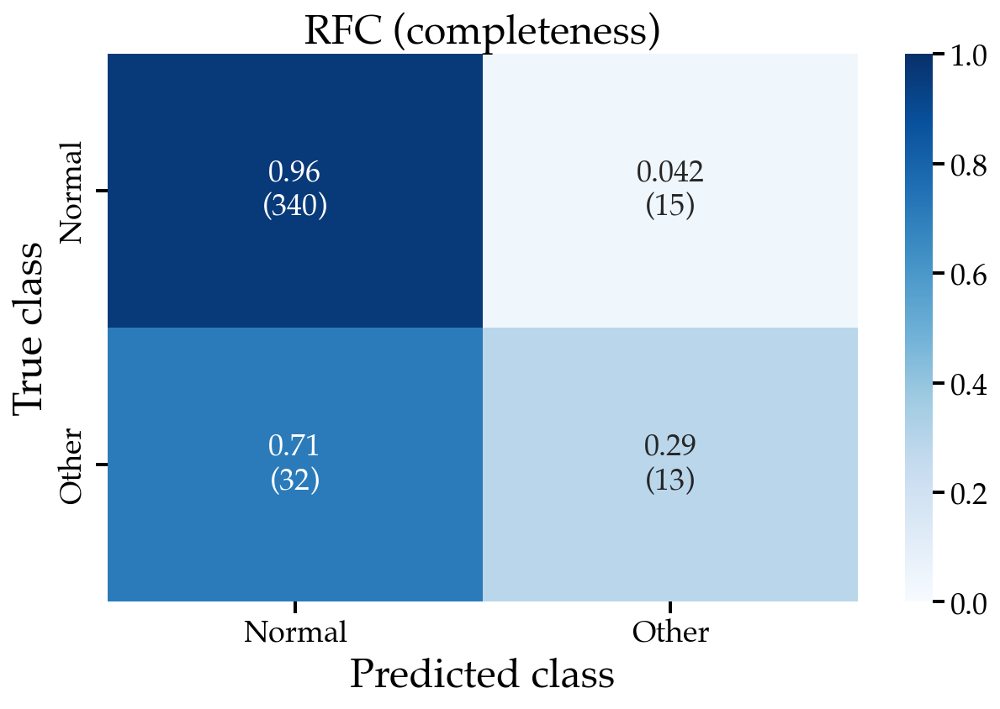

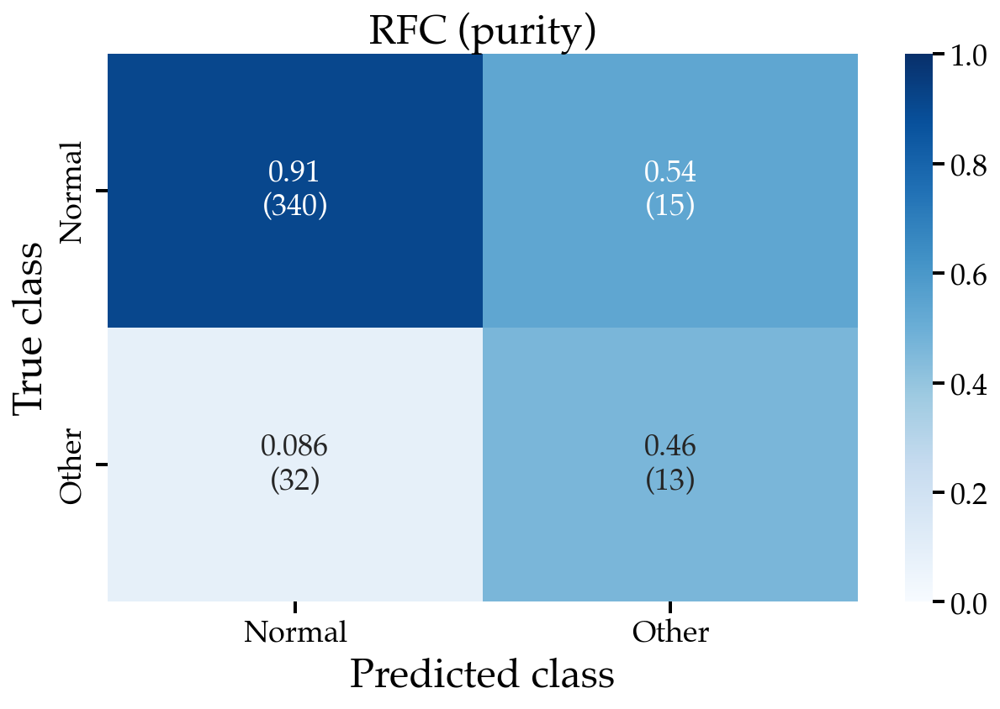

In [22]:
# Confusion matrices
title='RFC'
df = df2
true_labels = np.array(df['tns_cls'])
predicted_labels = np.array(df['RFC_best_cls'])#np.array(df['most_common_cls_ann=1-100']) # np.array(df['ann=1_tns_cls'])
# define the class labels
class_names = np.unique(true_labels)
nclasses = len(class_names)

# folder_path = f"../figures/confusion_matrix/{suffix}/grid_search_n_estimators={n_estimators}_max_depth={max_depth}_random_state={random_state}_max_features={max_features}_class_weight=1-1_noNoneCls/"
# if not os.path.exists(folder_path):
#     os.makedirs(folder_path)

KINDS = ['completeness', 'purity']
for KIND in KINDS:
    # Sims test set
    plot_conf_matrix(true_labels, predicted_labels, labels=class_names, 
             title=f'{title} ({KIND})', kind=KIND)
    #plt.savefig(f'{folder_path}/confmatrix_nclasses={nclasses}_noNone_{title}_{KIND}.jpg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

In [23]:
df2_other =df2[df2['tns_cls'] == 'Other']
df2_other_cor = df2_other[df2_other['tns_cls'] == df2_other['RFC_best_cls']]
df2_other_inc = df2_other[df2_other['tns_cls'] != df2_other['RFC_best_cls']]

df2_other_inc

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,has_tns,tns_cls,spec_z,report_group,s1,s2,s3,Normal,Other,RFC_best_cls
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21acqyqwu,0.164925,0.191106,0.222222,0.000000,0.351634,0.329849,0.255836,0.119952,0.677669,0.011867,...,Yes_TNS,Other,0.042000,ATLAS,-0.498909,1.834771,1.366241,75.000000,25.000000,Normal
ZTF21abchjer,0.913735,0.840731,0.300000,0.000000,0.433554,1.827471,1.705356,1.144432,-1.258488,0.040391,...,Yes_TNS,Other,0.024617,ALeRCE,-2.587601,-2.852107,2.015551,72.000410,27.999590,Normal
ZTF20abtjjhb,1.216100,1.723425,0.212766,0.063830,0.379014,2.288193,1.320570,0.658627,1.810624,-0.005769,...,Yes_TNS,Other,0.064000,ALeRCE,1.095970,-0.752407,1.390395,54.008909,45.991091,Normal
ZTF21aaffxdt,0.090092,0.572517,0.444444,0.000000,0.266570,0.180183,0.172565,0.140915,-1.796589,-0.003439,...,Yes_TNS,Other,0.090000,ATLAS,2.616150,1.548226,1.418332,82.000000,18.000000,Normal
ZTF20actekrw,0.489840,1.396014,0.166667,0.083333,0.382213,0.979679,0.923296,0.357985,0.701300,-0.003793,...,Yes_TNS,Other,0.033000,ALeRCE,-2.508101,-1.007435,2.457370,58.000000,42.000000,Normal
ZTF20acyydkh,0.224917,0.229615,0.222222,0.000000,0.341828,0.449835,0.366381,0.194325,0.178001,0.008407,...,Yes_TNS,Other,0.133000,ATLAS,1.362269,0.836418,3.228479,75.000000,25.000000,Normal
ZTF20abvquuo,1.015534,1.125783,0.413793,0.000000,0.447048,2.024803,1.637210,1.180090,-1.405189,0.021116,...,Yes_TNS,Other,0.030000,ZTF,3.136287,-0.814260,-2.272558,80.030801,19.969199,Normal
ZTF19abstsvm,0.533802,0.952866,0.227273,0.045455,0.343511,1.067604,0.388201,0.271093,5.288960,0.003764,...,Yes_TNS,Other,0.039000,AMPEL,1.990464,-1.140887,1.279958,67.000000,33.000000,Normal
ZTF20acueziy,0.884608,0.583604,0.333333,0.000000,0.439915,1.769217,1.548727,1.222932,-1.761423,0.024822,...,Yes_TNS,Other,0.023303,ZTF,-2.017529,-2.077537,0.045917,74.000000,26.000000,Normal


In [24]:
for ob in df2_other_inc.index:
    print(f'https://alerce.online/object/{ob}', x_test_all.loc[ob].tns_cls)

https://alerce.online/object/ZTF21acqyqwu SN Ib
https://alerce.online/object/ZTF21abchjer SN Ic-BL
https://alerce.online/object/ZTF20abtjjhb SN IIn
https://alerce.online/object/ZTF21aaffxdt SN IIn
https://alerce.online/object/ZTF20actekrw SN Ic
https://alerce.online/object/ZTF20acyydkh TDE
https://alerce.online/object/ZTF20abvquuo SN Ib
https://alerce.online/object/ZTF19abstsvm SN IIn
https://alerce.online/object/ZTF20acueziy SN Ic
https://alerce.online/object/ZTF20acusecr SN IIb
https://alerce.online/object/ZTF21acmrdga SN IIb
https://alerce.online/object/ZTF22aaaedas TDE
https://alerce.online/object/ZTF21abaxaqq TDE
https://alerce.online/object/ZTF20aclnplo SN Ic
https://alerce.online/object/ZTF21abtdvpg SN IIn
https://alerce.online/object/ZTF20acgiglu SN IIb
https://alerce.online/object/ZTF20aczgmai SN IIn
https://alerce.online/object/ZTF21aaxtctv SN Ic
https://alerce.online/object/ZTF21aaxxihx SN Ic-BL
https://alerce.online/object/ZTF21aarasky SN IIb
https://alerce.online/object/ZT

In [25]:
for ob in df2_other_cor.index:
    print(f'https://alerce.online/object/{ob}', x_test_all.loc[ob].tns_cls)

https://alerce.online/object/ZTF20abwxywy SN Ic
https://alerce.online/object/ZTF21aafmkjk SN IIn
https://alerce.online/object/ZTF21aaabwfu SN IIb
https://alerce.online/object/ZTF21aautijg SN IIn
https://alerce.online/object/ZTF20acxqxyw SN Ib
https://alerce.online/object/ZTF21abcgnqn TDE
https://alerce.online/object/ZTF18acvgjqv SN IIn
https://alerce.online/object/ZTF18acaqdaa TDE
https://alerce.online/object/ZTF21aaaokyp TDE
https://alerce.online/object/ZTF21aapvvtb TDE
https://alerce.online/object/ZTF20acnznms SLSN-II
https://alerce.online/object/ZTF19aaadwfi SLSN-II
https://alerce.online/object/ZTF20acwytxn TDE


In [26]:
df2_normal =df2[df2['tns_cls'] != 'Other']

df2_normal_cor = df2_normal[df2_normal['tns_cls'] == df2_normal['RFC_best_cls']]
df2_normal_inc = df2_normal[df2_normal['tns_cls'] != df2_normal['RFC_best_cls']]

for ob in df2_normal_inc.index:
    print(f'https://alerce.online/object/{ob}', x_test_all.loc[ob].tns_cls)

https://alerce.online/object/ZTF20abarsvz SN Ia
https://alerce.online/object/ZTF21abzbwfo SN II
https://alerce.online/object/ZTF21aaizyqc SN II
https://alerce.online/object/ZTF21aajvukh SN II
https://alerce.online/object/ZTF20accmtgt SN Ia
https://alerce.online/object/ZTF21aadacxv SN II
https://alerce.online/object/ZTF20achoqvb SN Ia
https://alerce.online/object/ZTF21acmnpqa SN Ia
https://alerce.online/object/ZTF20acyroke SN Ia
https://alerce.online/object/ZTF19aaeuhgo SN II
https://alerce.online/object/ZTF21aagoliy SN Ia
https://alerce.online/object/ZTF18abaeqpf SN II
https://alerce.online/object/ZTF21aapffqd SN II
https://alerce.online/object/ZTF20abqlmwn SN II
https://alerce.online/object/ZTF21abpyauz SN II


In [27]:
# actually very long lived SN II, very red, one Ia-CSM, IIb, (MUCH better than numbers suggest slightly...)
# all interesting really!...

In [28]:
# (for Non-latent space input) TDE like FLEET works, not SN Ib, SN Ic, SLSN-II...

# TODO: add in latent space dim data with features input!!

In [29]:
# (with latent space input) TDE like FLEET works, not SN Ib, SN Ic, SLSN-II...

# See time dependence! When were things tagged interesting?

In [30]:
anom_thresh = 55
#df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/CVAE_dataframes"
df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/figures/CVAE/SMOTE_train_test_70-30_min14_kneighbors8/256_epochs=250_latent_dim=3_10000xClassLoss/dataframes"

anom_ztfid = 'ZTF22aaezyos'   #'ZTF22aaaedas'  #'ZTF21aaquhqr'  #'ZTF22aaezyos' #'ZTF21acaqdnb' #'ZTF19aamsetj' # 'ZTF20aalxlis'
#anom_ztfid = 'ZTF20aciudrr'   #'ZTF20aclgnds'  #'ZTF21abjdiok' #'ZTF21abeokcr'-border #'ZTF21aaabuoj' #'ZTF21abmspzt' #'ZTF20aciudrr' # really Ia inlier at s1,s2,s3=(0,0,0) for testing

#anom_ztfid ='ZTF20aciudrr'

#anom_ztfid = 'ZTF21aaazjia' # normal Ia
#lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}.csv')
lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')

#lc_and_hosts_df = lc_and_hosts_df.set_index('ztf_object_id')
lc_and_hosts_df = lc_and_hosts_df.dropna()
lc_and_hosts_df

,ztf_object_id,obs_num,mjd_cutoff,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_eta_e_magn_r,feature_inter_percentile_range_2_magn_r,...,SN II,SN IIP,SN IIb,SN IIn,SN Ia,SN Ia-91T-like,SN Ib,SN Ic,SN Ic-BL,TDE
5,ZTF22aaezyos,10,59684.304931,0.589437,0.437856,0.285714,0.0,0.436823,30156.774154,1.178875,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,ZTF22aaezyos,11,59684.305393,0.589437,0.437856,0.285714,0.0,0.436823,30156.774154,1.178875,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,ZTF22aaezyos,12,59684.348762,0.622750,0.544949,0.250000,0.0,0.430437,30193.484777,1.245501,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
8,ZTF22aaezyos,13,59684.399468,0.681070,0.581715,0.444444,0.0,0.418303,19367.827935,1.362141,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,ZTF22aaezyos,14,59687.383322,0.681070,0.707230,0.300000,0.0,0.407507,23824.348072,1.362141,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,ZTF22aaezyos,96,59756.220231,1.393237,1.677086,0.491803,0.0,0.423914,7161.339238,2.715008,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
92,ZTF22aaezyos,97,59756.222107,1.393237,1.697444,0.500000,0.0,0.423758,9134.326249,2.713023,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
93,ZTF22aaezyos,98,59758.264468,1.393237,1.656990,0.492063,0.0,0.421838,8870.021307,2.720691,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
94,ZTF22aaezyos,99,59758.283218,1.393237,1.654980,0.515625,0.0,0.420494,8273.296064,2.718960,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [31]:
anom_obj_df = lc_and_hosts_df[x_test.columns]
anom_obj_df

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yKronRad,yExtNSigma,i-z,gApMag_gKronMag,rApMag_rKronMag,iApMag_iKronMag,zApMag_zKronMag,yApMag_yKronMag,7DCD,dist/DLR
5,0.589437,0.437856,0.285714,0.0,0.436823,1.178875,1.117517,0.815537,-1.933226,-0.162193,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
6,0.589437,0.437856,0.285714,0.0,0.436823,1.178875,1.117517,0.815537,-1.933226,-0.162193,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
7,0.622750,0.544949,0.250000,0.0,0.430437,1.245501,1.144123,0.872781,-1.591579,-0.131938,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
8,0.681070,0.581715,0.444444,0.0,0.418303,1.362141,1.206965,0.898657,-1.253605,-0.130593,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
9,0.681070,0.707230,0.300000,0.0,0.407507,1.362141,1.224514,0.940102,-0.970987,-0.100963,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,1.393237,1.677086,0.491803,0.0,0.423914,2.715008,2.242063,1.352417,-1.173598,-0.002104,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
92,1.393237,1.697444,0.500000,0.0,0.423758,2.713023,2.232467,1.387230,-1.191989,-0.000450,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
93,1.393237,1.656990,0.492063,0.0,0.421838,2.720691,2.278589,1.396633,-1.187418,0.000201,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
94,1.393237,1.654980,0.515625,0.0,0.420494,2.718960,2.314863,1.439628,-1.197615,0.001179,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362


In [32]:
pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)

orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
diff = len(orig)-len(pred_prob_anom)
anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF22aaezyos


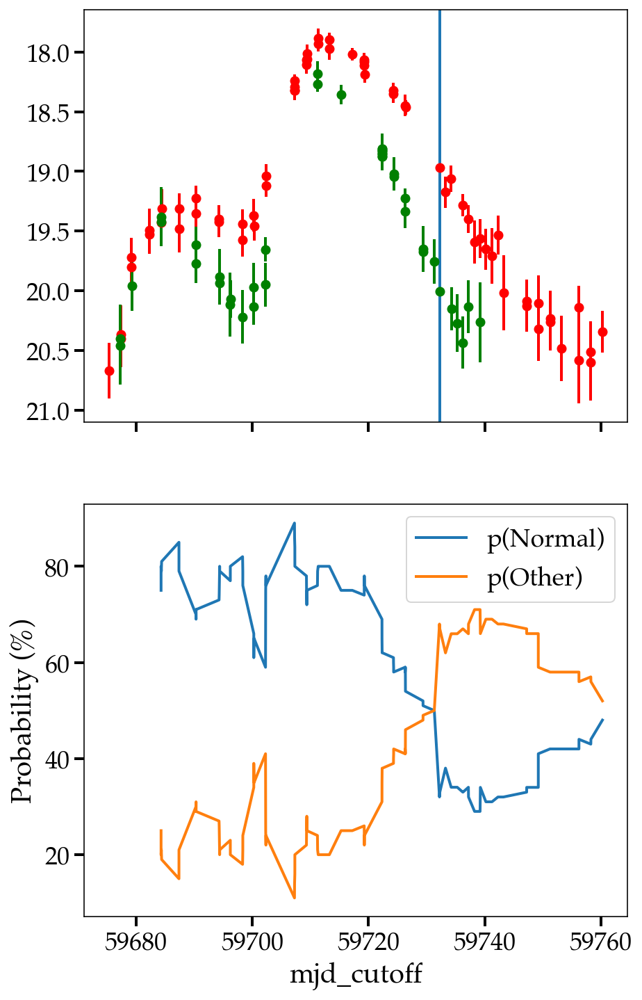

In [33]:
# Predict Excluded Object
import antares_client
ztf_id_ref = anom_ztfid 

ref_info = antares_client.search.get_by_ztf_object_id(ztf_object_id=ztf_id_ref)

df_ref = ref_info.timeseries.to_pandas()

df_ref_g = df_ref[(df_ref.ant_passband == 'g') & (~df_ref.ant_mag.isna())]
df_ref_r = df_ref[(df_ref.ant_passband == 'R') & (~df_ref.ant_mag.isna())]

mjd_idx_at_min_mag_r_ref = df_ref_r[['ant_mag']].reset_index().idxmin().ant_mag
mjd_idx_at_min_mag_g_ref = df_ref_g[['ant_mag']].reset_index().idxmin().ant_mag

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7,12))
ax1.invert_yaxis()
ax1.errorbar(x=df_ref_r.ant_mjd, y=df_ref_r.ant_mag, yerr=df_ref_r.ant_magerr, fmt='o', c='r', 
            label=f'REF: {ztf_id_ref}')
ax1.errorbar(x=df_ref_g.ant_mjd, y=df_ref_g.ant_mag, yerr=df_ref_g.ant_magerr, fmt='o', c='g')
ax1.axvline(x=lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx].mjd_cutoff.values[0])
#ax1.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

print(f'https://alerce.online/object/{anom_ztfid}')
ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 0], label='p(Normal)')
ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 1], label='p(Other)')
#ax2.axhline(y=50)

#ax2.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

plt.xlabel('mjd_cutoff')
plt.ylabel('Probability (%)')
plt.legend()
plt.show()

In [34]:
# gets ZTF22aaezyos/2022hgk (double peak Ib at z=0.033 at ~18.8mag)
# gets ZTF20aalxlis/2020bvc (Ic-BL at z=0.02 at ~19mag)

### all objects in test set.

ZTF21abflgpq SN Ia
ZTF21abkaoxe SN Ia
ZTF20acpkled SN Ia
ZTF21aaazjia SN Ia
ZTF21acqyqwu SN Ib
ZTF20acvdqtg SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaabwem SN IIP
ZTF20acqzpta SN Ia
ZTF21abhrmrv SN Ia
ZTF21aaabuoj SN Ia
ZTF20acbiwri SN II
ZTF20abarsvz SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

15
https://alerce.online/object/ZTF20abarsvz SN Ia


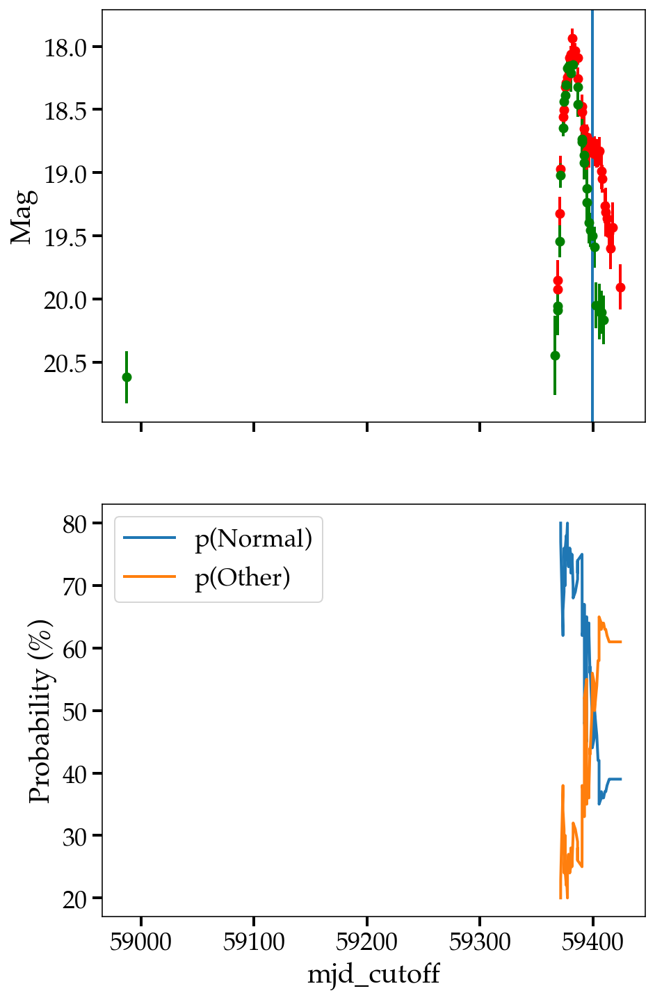

ZTF21abrxoir SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


13
https://alerce.online/object/ZTF21abrxoir SN Ia


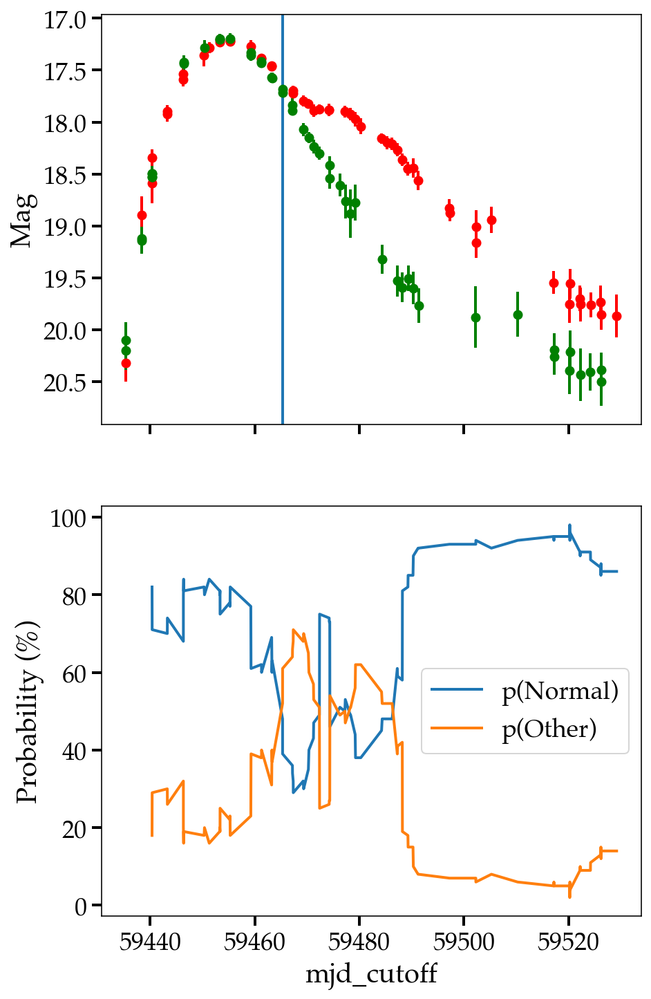

ZTF21aaagzee SN Ia
ZTF21abfxjkq SN II
ZTF21abcnkbe SN Ia
ZTF21aciqcge SN Ia
ZTF20acwfftd SN Ia
ZTF21abzbwfo SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

1
https://alerce.online/object/ZTF21abzbwfo SN II


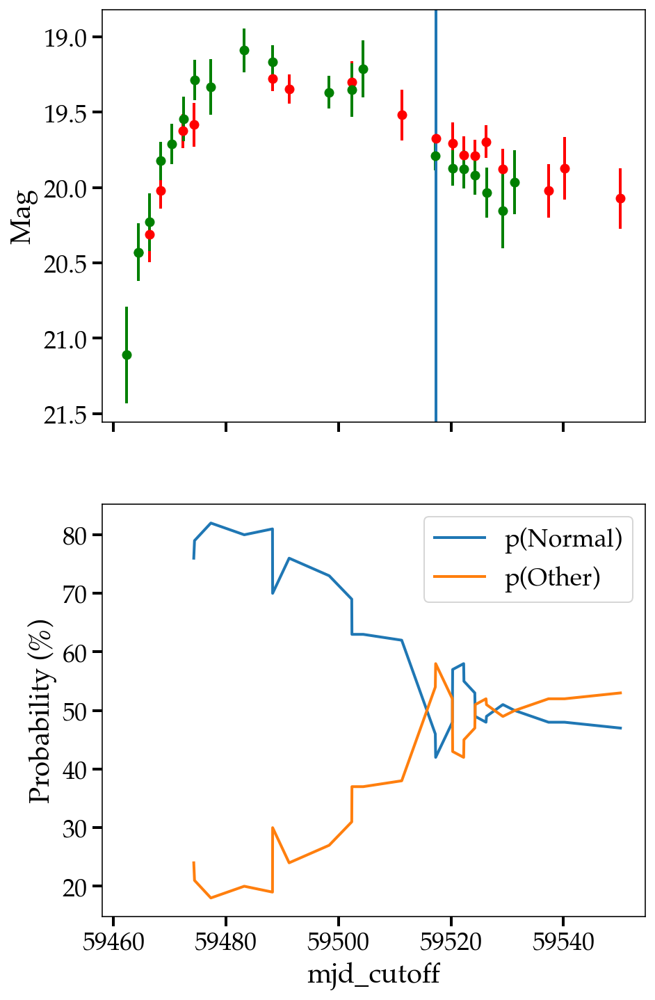

ZTF21aahzspd SN Ia
ZTF21aalnhby SN Ia
ZTF21abizxkw SN Ia
ZTF21abjaksr SN Ia
ZTF20aciudrr SN Ia
ZTF21aarejnt SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaxzbrn SN Ia
ZTF20abwxywy SN Ic


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


8
https://alerce.online/object/ZTF20abwxywy SN Ic


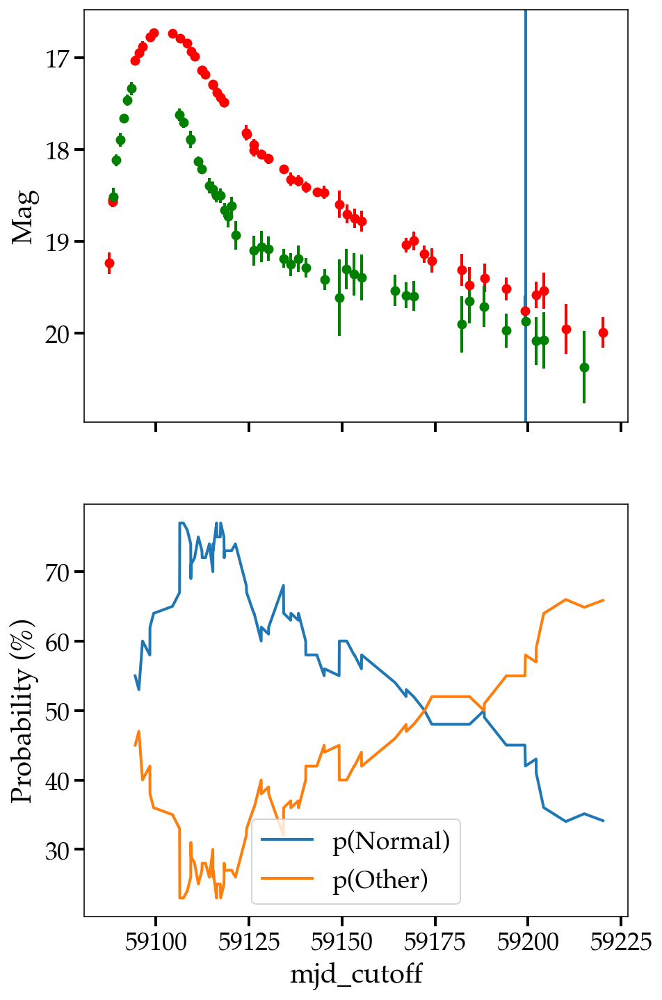

ZTF21aamucom SN Ia-91T-like
ZTF18aaisqmw SN Ia
ZTF20acowcee SN Ia
ZTF21aajuerd SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF21abchjer SN Ic-BL
ZTF21aaizyqc SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


20
https://alerce.online/object/ZTF21aaizyqc SN II


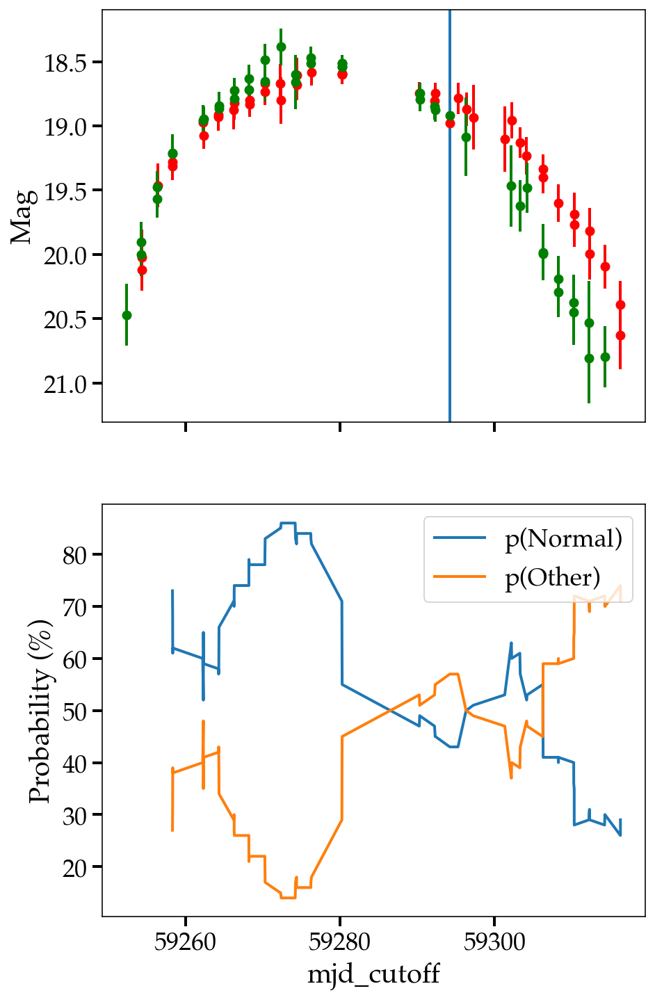

ZTF21acefbte SN Ia
ZTF21aapzzgf SN Ia
ZTF20abtjjhb SN IIn
ZTF21aaffxdt SN IIn
ZTF21acaegsr SN Ia
ZTF21aabygea SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaczpca SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF22aaafdna SN Ia
ZTF21aamwqim SN II
ZTF21acnfoqn SN II
ZTF21aajvukh SN II
4
https://alerce.online/object/ZTF21aajvukh SN II


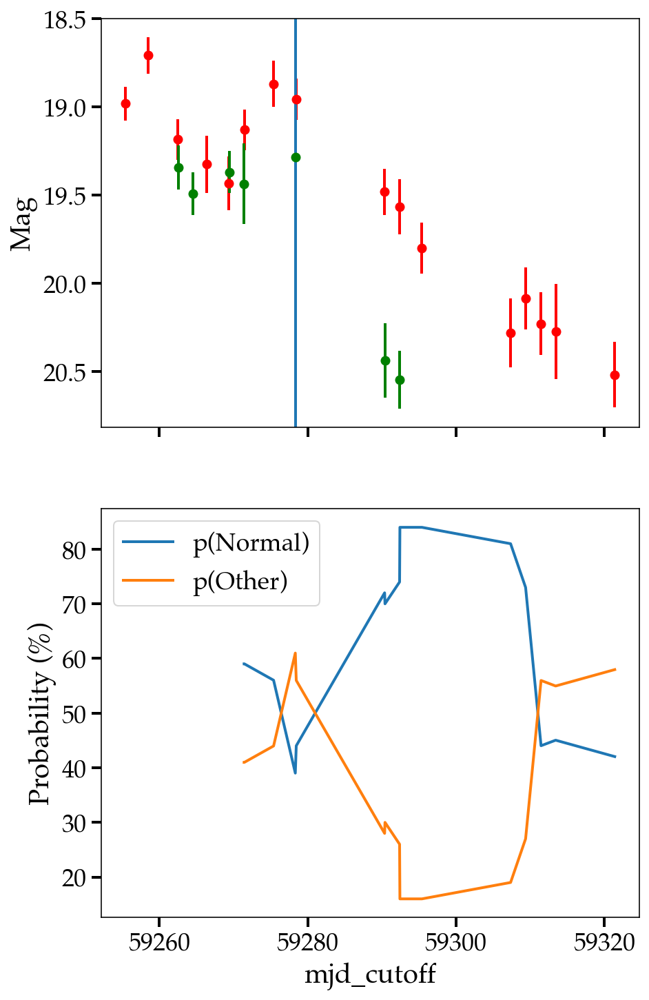

ZTF21aakybgi SN Ia
ZTF21aapkhsc SN Ia
ZTF18aayyqia SN Ia
ZTF21abqpwpu SN Ia
ZTF20acqlcge SN Ia
ZTF21aafmkjk SN IIn


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20achtpbn SN Ia
ZTF21acgyzel SN Ia
ZTF20acxncha SN Ia
ZTF21aarwlht SN Ia
ZTF20actekrw SN Ic


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

1
https://alerce.online/object/ZTF20actekrw SN Ic


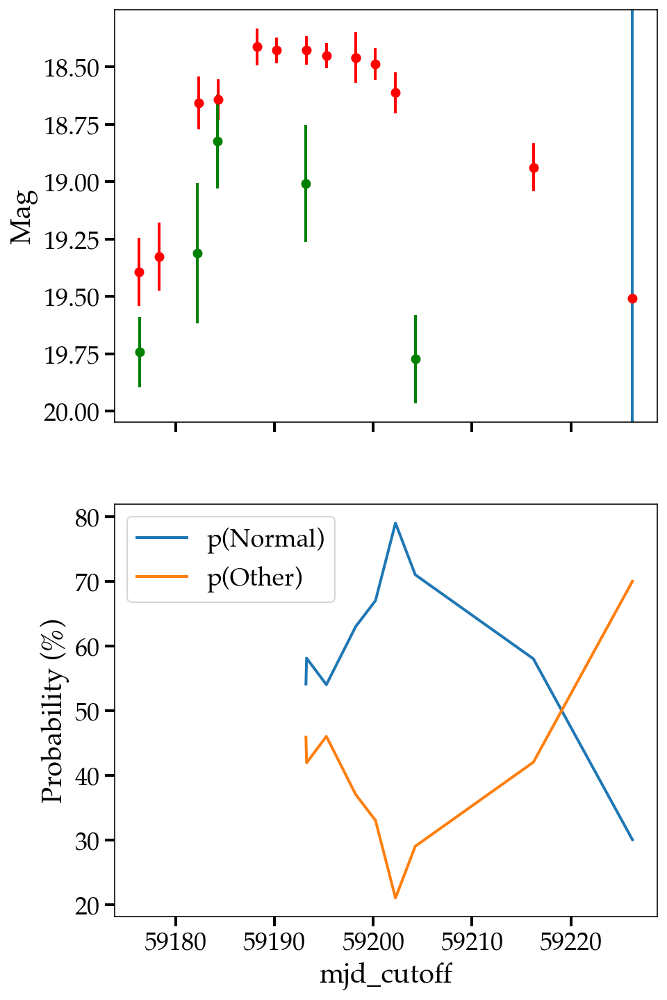

ZTF20acwyihb SN Ia
ZTF21aaxtdrs SN Ia
ZTF21abcmtev SN II
ZTF21abjdqbo SN Ia
ZTF21abrzsol SN Ia
couldn't feature space as func of time for ZTF21abrzsol. Make anom epoch -9
ZTF20acyydkh TDE
ZTF21abcnpnk SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

1
https://alerce.online/object/ZTF21abcnpnk SN Ia


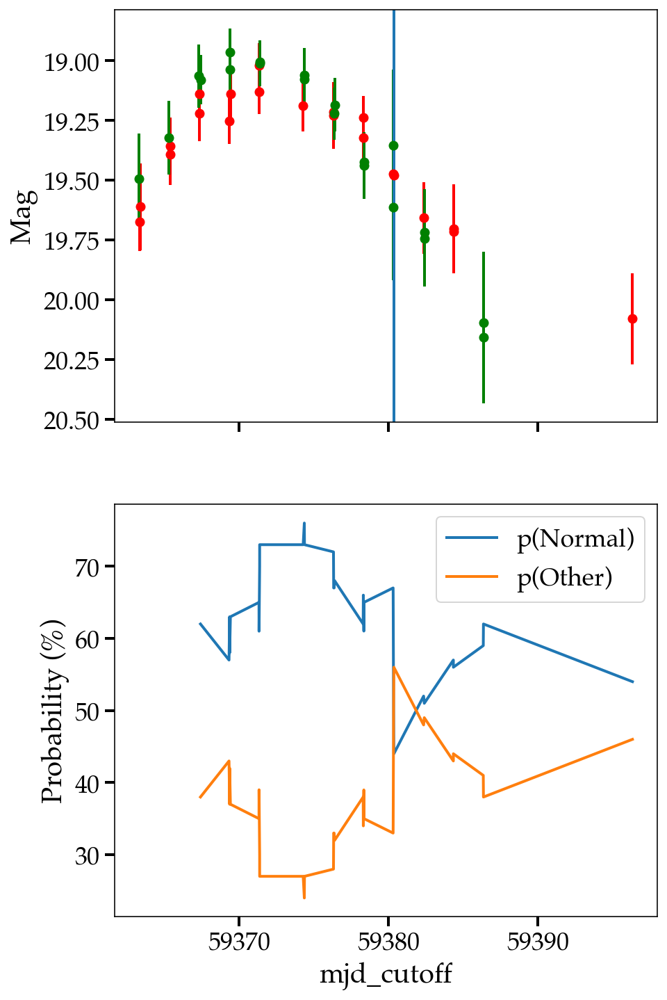

ZTF20abyzomt SN II
ZTF21aaabwfu SN IIb
ZTF20acpwjus SN Ia-91T-like
ZTF21aagtqgz SN Ia-91T-like
ZTF20abywydb SN II
ZTF22aaabnwa SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaabzap SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF22aaaeeva SN Ia
ZTF21abxknvv SN Ia
ZTF21aakigqr SN II
ZTF21abhttll SN Ia
ZTF20accmtgt SN Ia


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


19
https://alerce.online/object/ZTF20accmtgt SN Ia


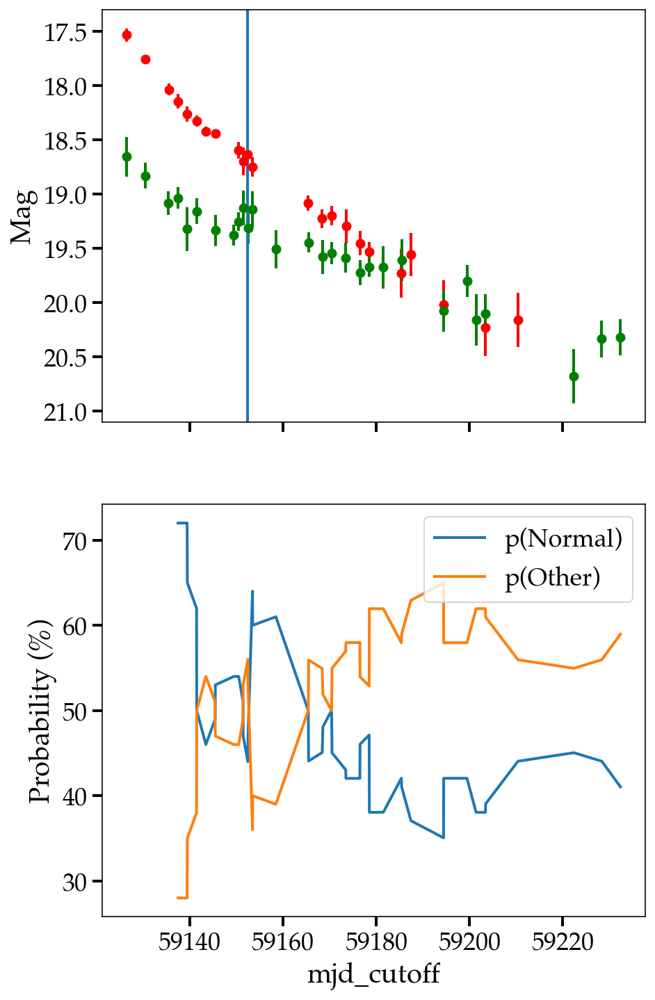

ZTF20abvquuo SN Ib
ZTF21achkgap SN Ia
ZTF21aarohyu SN Ia
ZTF21abjdiok SN Ia
ZTF21acdoydr SN Ia
ZTF21aaqzqaa SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abkkwie SN Ia
ZTF19abstsvm SN IIn
ZTF22aaafdrn SN Ia
ZTF20acueziy SN Ic
ZTF20acuoclk SN Ia
ZTF21acdcxfz SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aasufxv SN Ia
ZTF18abufaej SN II
ZTF21aautijg SN IIn


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


4
https://alerce.online/object/ZTF21aautijg SN IIn


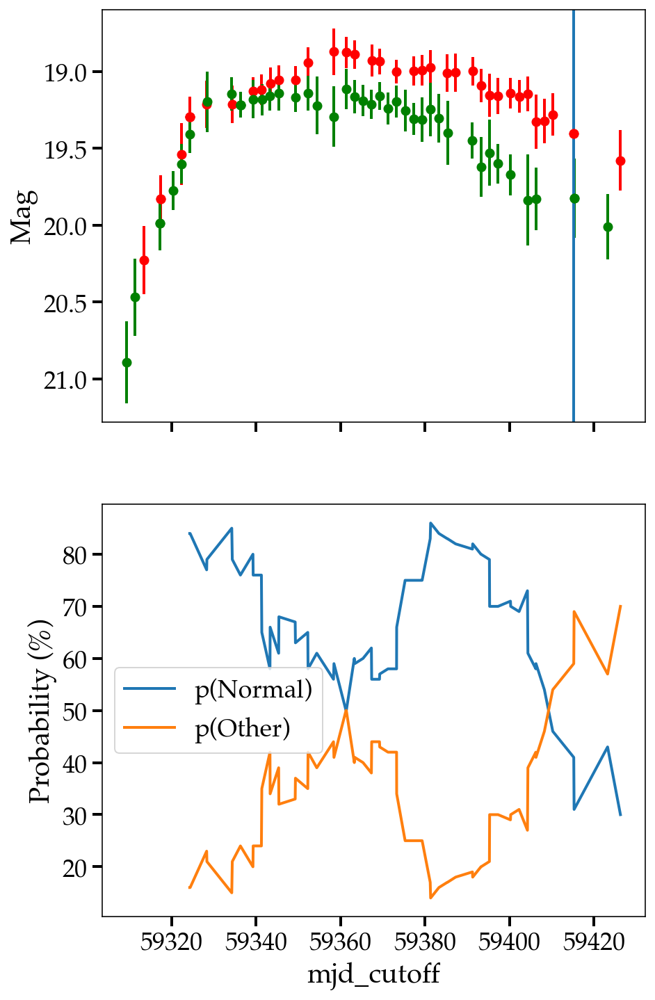

ZTF21aarasvn SN II
ZTF20acjdhof SN Ia-91T-like
ZTF21aaxstzy SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


7
https://alerce.online/object/ZTF21aaxstzy SN Ia


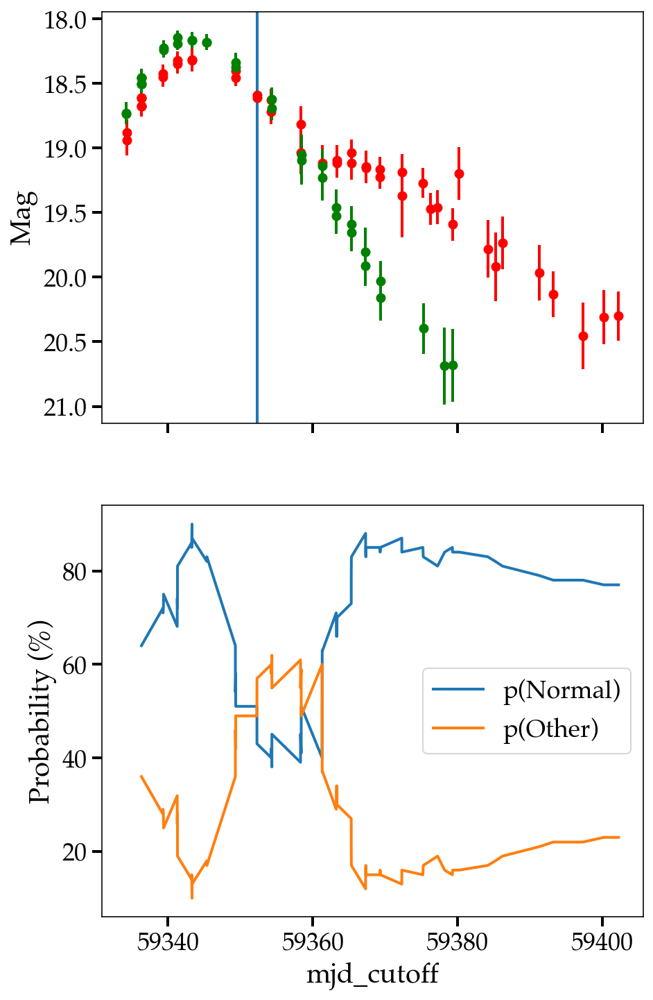

ZTF21aalxurx SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF21aalxurx SN II


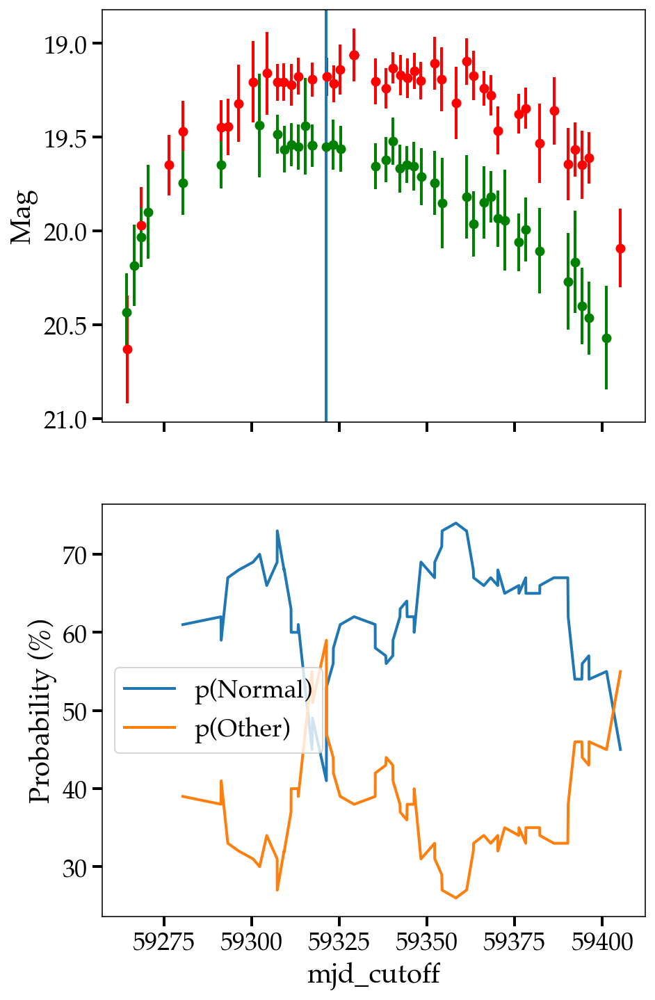

ZTF21aawckpe SN Ia
ZTF21aawlwoy SN Ia
ZTF21aaadiap SN Ia
ZTF21aaqzkhx SN Ia
ZTF18abrfccm SN Ia
ZTF20acsesce SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acxbbaj SN Ia
ZTF21aadacxv SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


17
https://alerce.online/object/ZTF21aadacxv SN II


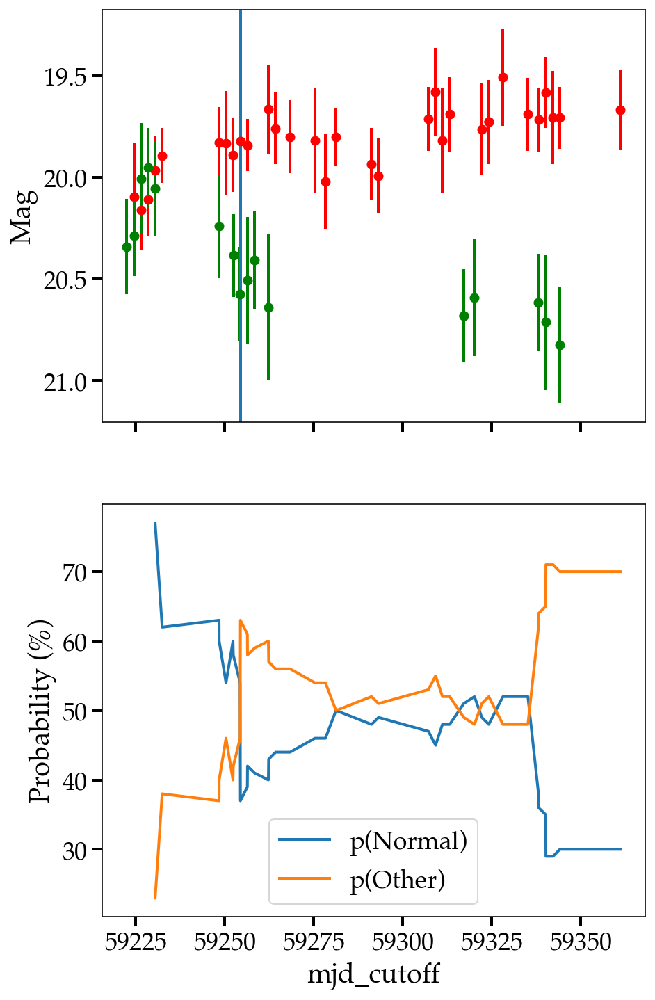

ZTF20acfkyll SN II
ZTF21absbwyz SN Ia
ZTF20acuzlib SN Ia
ZTF21abicgai SN Ia
ZTF21aalydkl SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21acaqdnb SN Ia
ZTF21abmwgow SN Ia
ZTF21aadkhte SN II
ZTF22aaailga SN Ia
ZTF21aagmoqw SN Ia
ZTF20acywefl SN Ia


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

ZTF21abidxwo SN II
ZTF21abzgzvs SN Ia
ZTF20acxqxyw SN Ib


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


5
https://alerce.online/object/ZTF20acxqxyw SN Ib


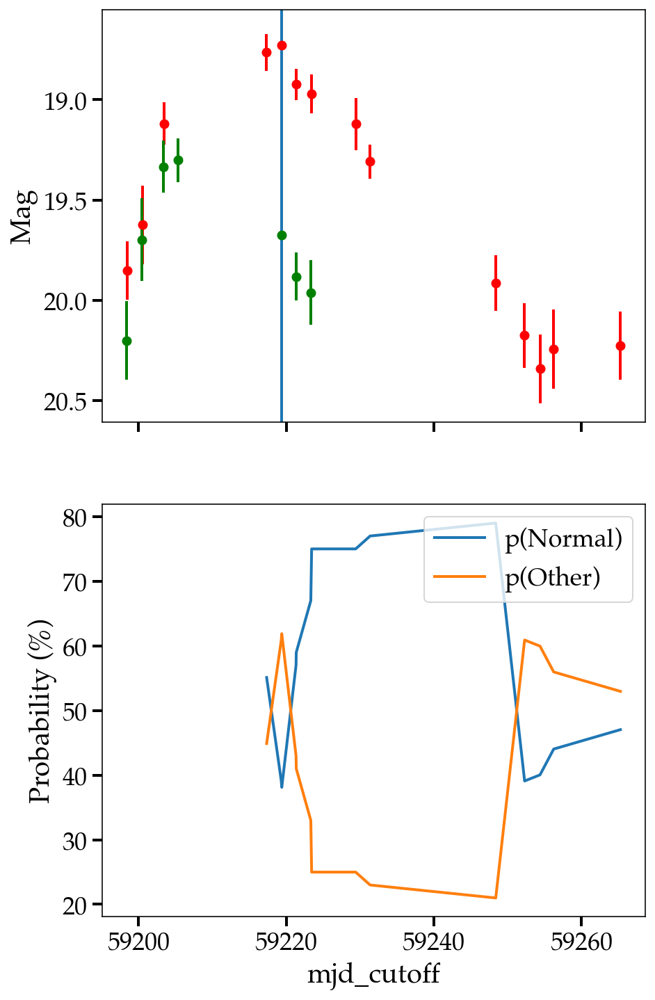

ZTF21aagyxgr SN Ia
ZTF21abvqrln SN Ia
ZTF21abpland SN Ia
ZTF21acbjxhr SN Ia
ZTF20abweedo SN Ia
ZTF21aalenaa SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acmbhgy SN Ia
ZTF21aaoekcj SN Ia
ZTF21aazazvw SN Ia
ZTF21abplsmq SN Ia
ZTF20actkutp SN II
ZTF21abtuutw SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abwdzio SN Ia
ZTF21abxpinb SN Ia
ZTF21abcgnqn TDE


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


7
https://alerce.online/object/ZTF21abcgnqn TDE


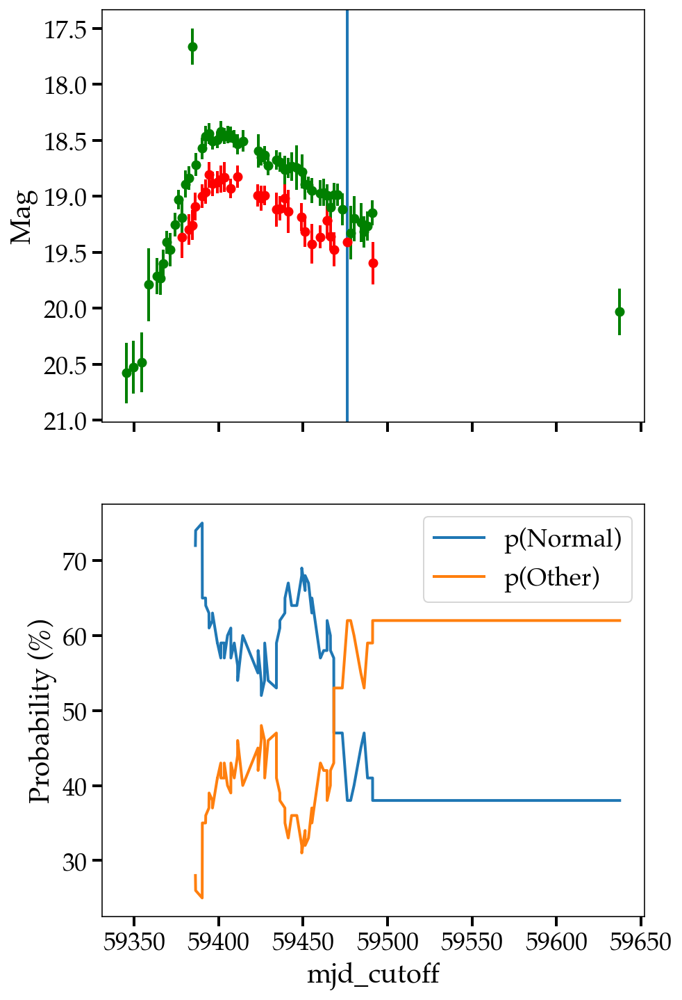

ZTF21abnvsic SN Ia
ZTF21aarytbc SN II
ZTF20acvjagm SN II
ZTF21abbzcxe SN Ia
ZTF18aawitry SN Ia
ZTF21aazwtoz SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aavxruq SN Ia
ZTF21aaluoym SN Ia
ZTF21abbuxfm SN Ia
ZTF20actveqm SN Ia
ZTF21ackeofr SN Ia
ZTF20acuhgar SN II


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


28
https://alerce.online/object/ZTF20acuhgar SN II


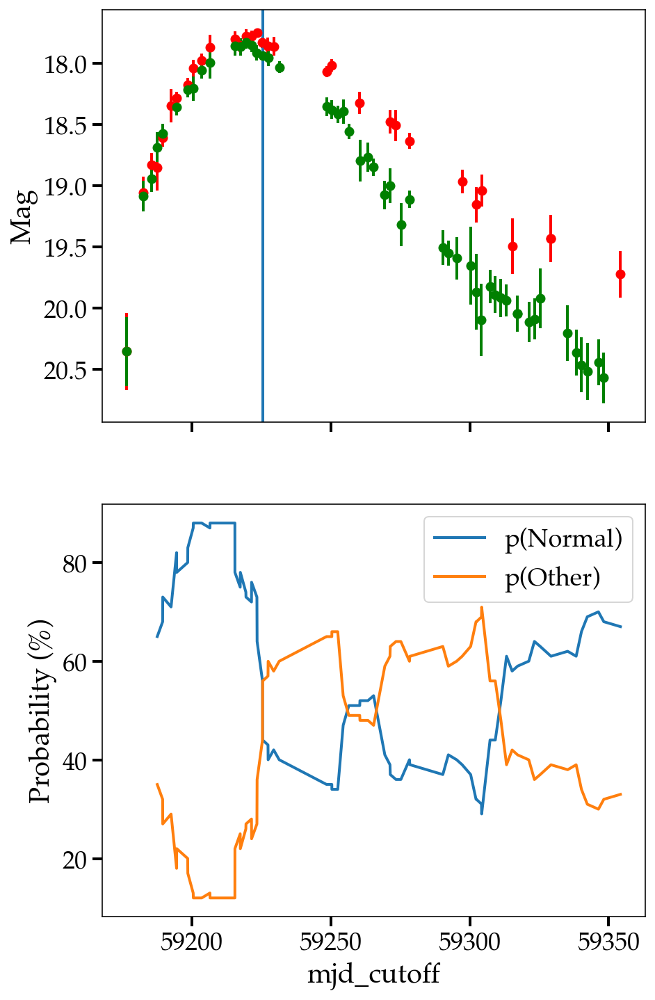

ZTF20aczgvcg SN Ia
ZTF20acpknjk SN Ia
ZTF21acjosgg SN Ia
ZTF21acajcyb SN Ia
ZTF20abvowvw SN Ia
ZTF22aaaepjq SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF18acvgjqv SN IIn


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


25
https://alerce.online/object/ZTF18acvgjqv SN IIn


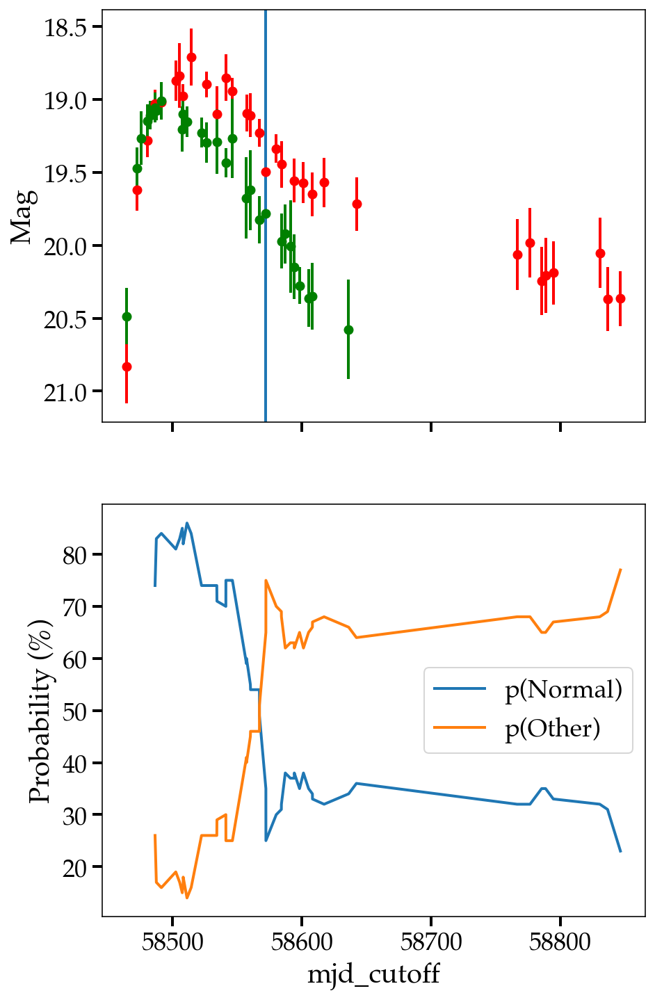

ZTF18aacnlxz SN II
ZTF20acflmyv SN Ia
ZTF20acxznai SN Ia
ZTF21abfxlvo SN Ia
ZTF20achtubm SN Ia
ZTF18aaiwewk SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abuuuuj SN Ia
ZTF21aahsqng SN Ia
ZTF20achoqvb SN Ia
ZTF21abbkvrt SN Ia
ZTF22aaahhbo SN II
ZTF18aaoxrup SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF18abrebsb SN Ia
ZTF21aayyxum SN Ia
ZTF21abicckd SN Ia
ZTF20acusecr SN IIb
ZTF21acmrdga SN IIb
ZTF21abviabc SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaxubqf SN Ia
ZTF21aasgcve SN Ia-91T-like
ZTF21aaagypx SN IIP
ZTF20acxtdcm SN II
ZTF20acrerzb SN Ia
ZTF18aaqnxjb SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF22aaaedas TDE


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF20acajvrj SN Ia
ZTF20aciuciv SN II
ZTF21aappktx SN Ia
ZTF21abbwbja SN Ia
ZTF20aatxryt SN Ia
couldn't feature space as func of time for ZTF20aatxryt. Make anom epoch -9
ZTF21acizsaz SN Ia
ZTF18acbvgtu SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acnagjb SN Ia
ZTF21abaxaqq TDE
ZTF22aaabnan SN Ia
ZTF20aclnplo SN Ic
ZTF18acsremz SN Ia
ZTF18acaqdaa TDE


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


68
https://alerce.online/object/ZTF18acaqdaa TDE


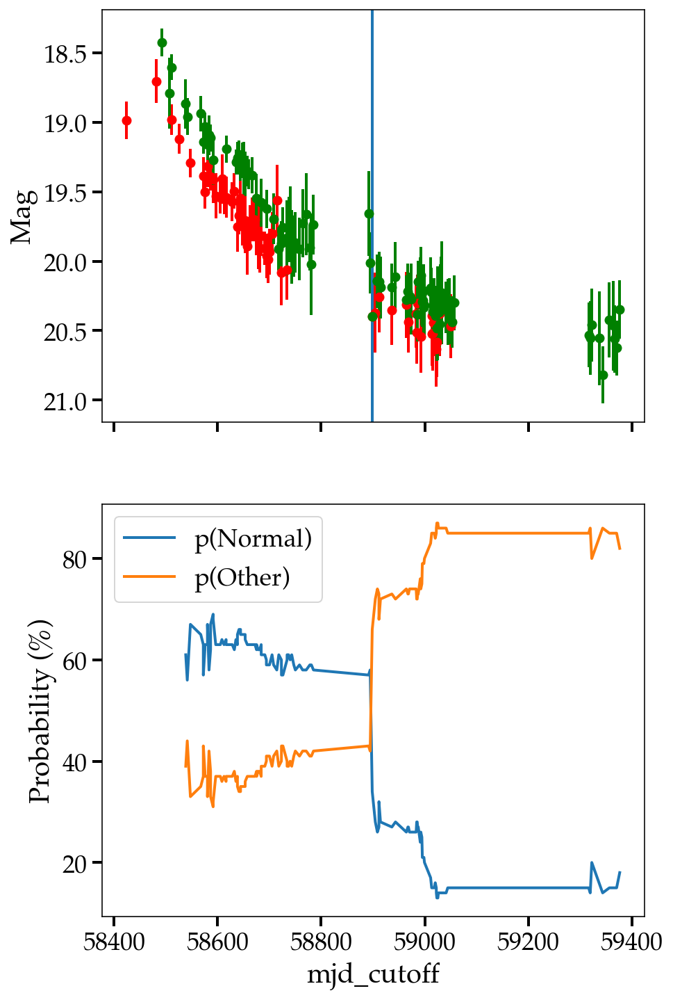

ZTF21aaphlty SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF21aaphlty SN Ia


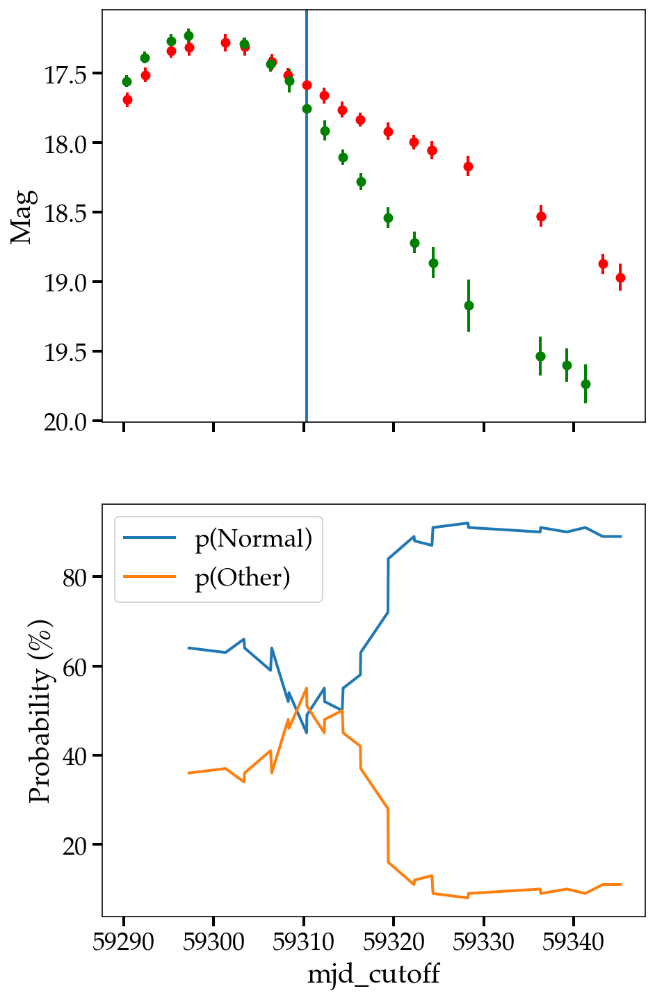

ZTF20acgznau SN Ia
ZTF20actpbck SN Ia
ZTF21achqiue SN Ia
ZTF21aaswtok SN Ia
ZTF21aapkfjx SN Ia
ZTF21aagsypp SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acpxvez SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF20acfnuee SN Ia
ZTF21acmnpqa SN Ia
ZTF21aagtill SN Ia
ZTF20acwncbd SN Ia
ZTF20acyroke SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


27
https://alerce.online/object/ZTF20acyroke SN Ia


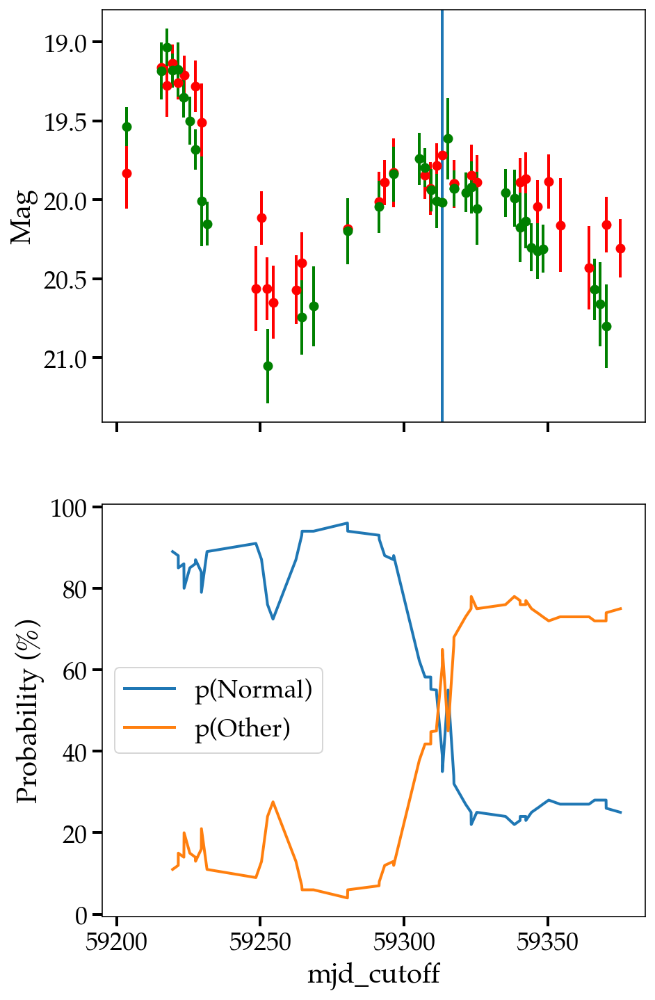

ZTF20accodxy SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF20accodxy SN Ia


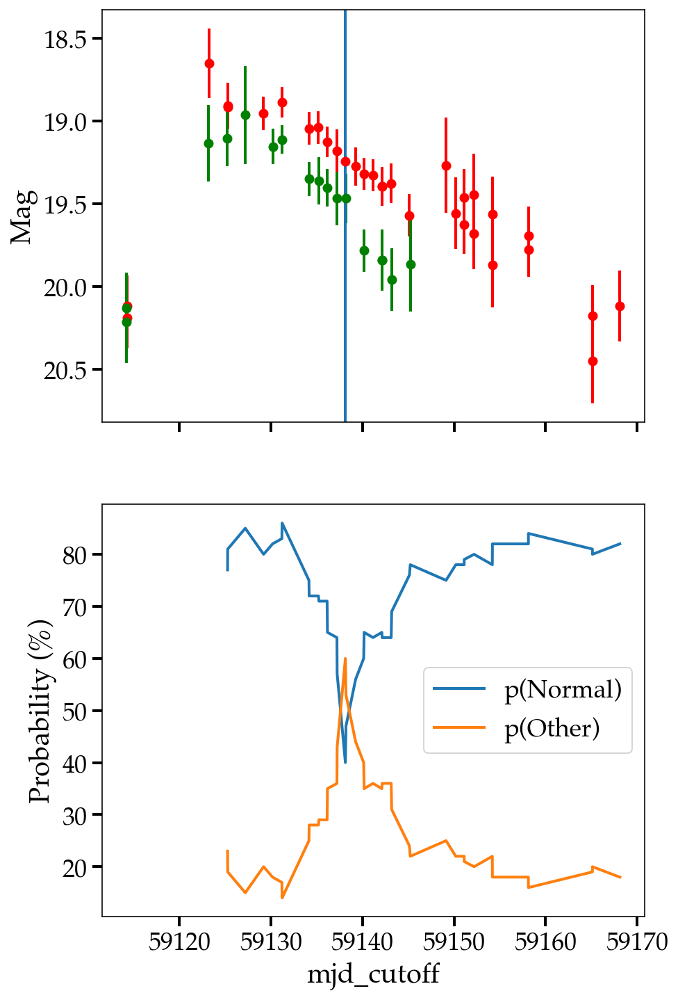

ZTF19aaeuhgo SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


18
https://alerce.online/object/ZTF19aaeuhgo SN II


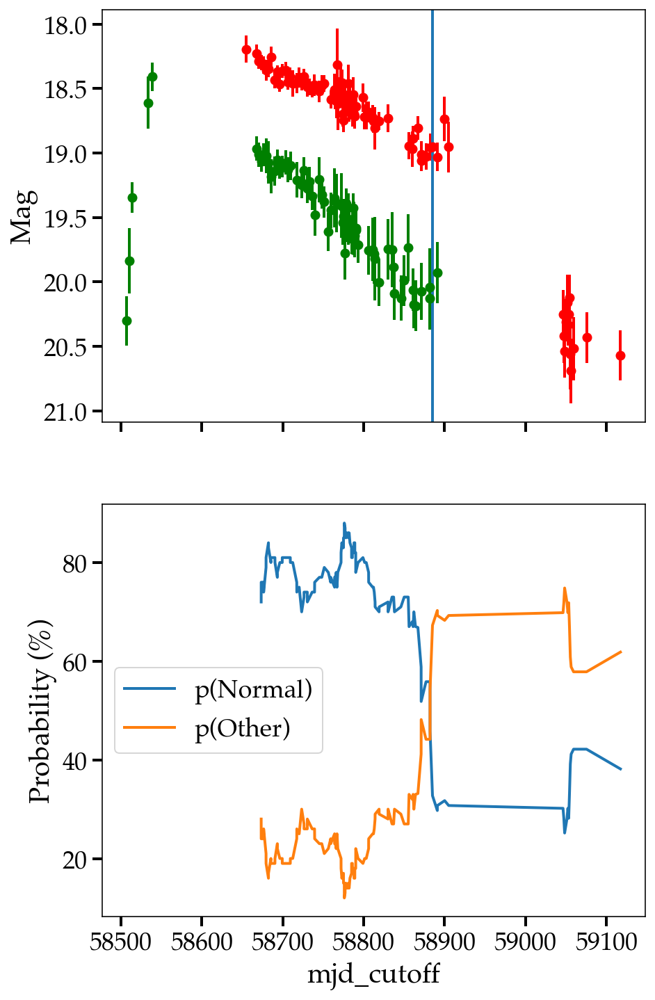

ZTF21aabyqps SN Ia
ZTF21acmresp SN Ia
ZTF21abdlyrc SN Ia
ZTF21aaaokyp TDE


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


25
https://alerce.online/object/ZTF21aaaokyp TDE


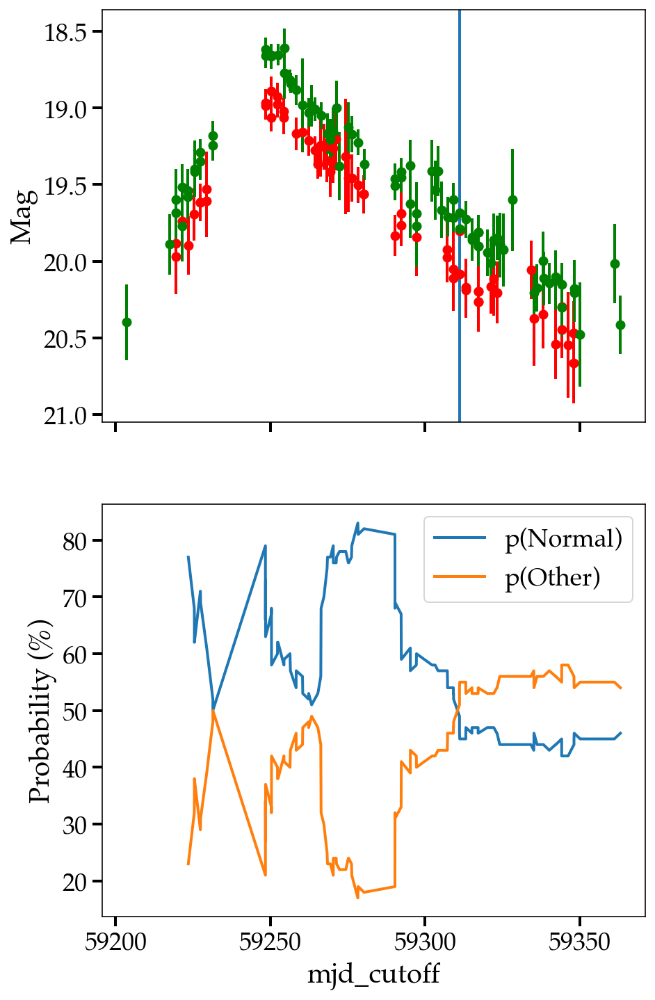

ZTF21aajgdpo SN II
ZTF21aadzuil SN Ia
ZTF21aabgdda SN Ia
ZTF18acuimze SN Ia
ZTF22aaaepao SN II
ZTF21aapvvtb TDE


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

17
https://alerce.online/object/ZTF21aapvvtb TDE


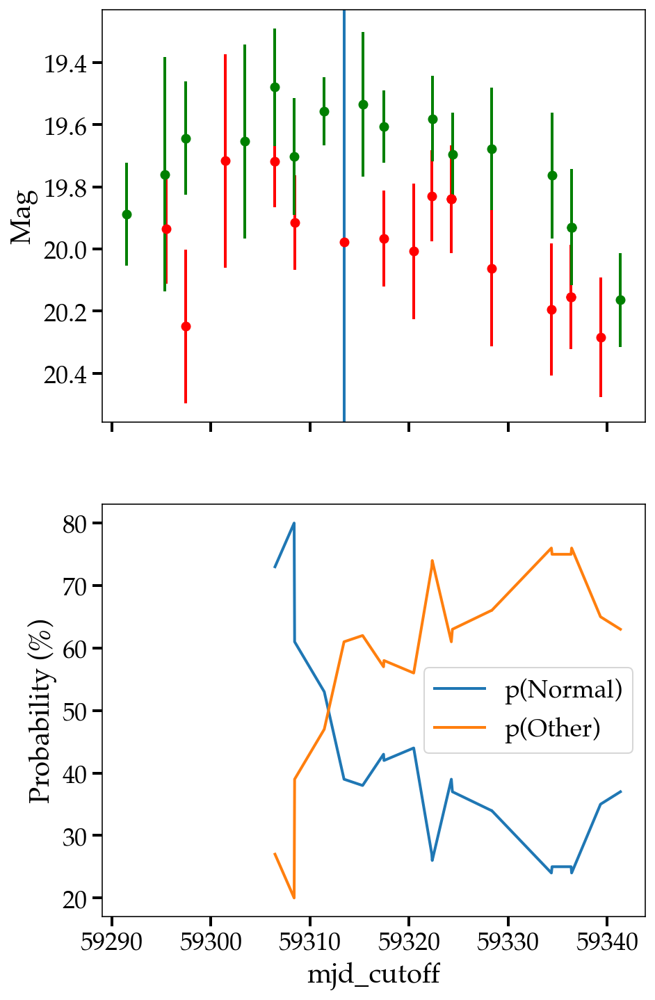

ZTF21abzkgvc SN Ia
ZTF21aaahyjj SN Ia-91T-like


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


3
https://alerce.online/object/ZTF21aaahyjj SN Ia-91T-like


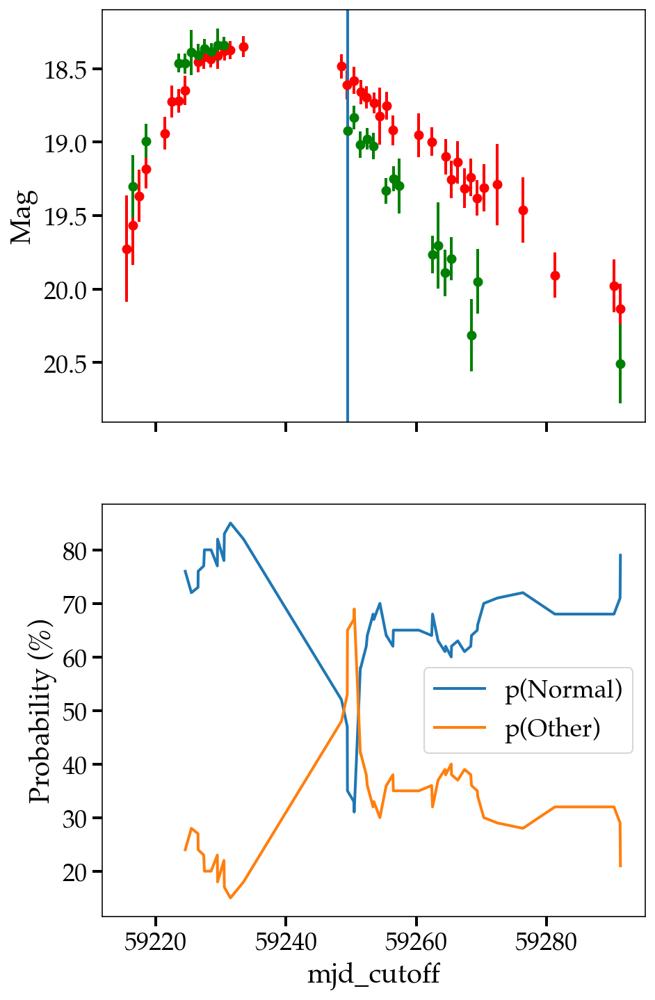

ZTF20acjpwdk SN Ia
ZTF21aazhegf SN II
ZTF18acbygcu SN Ia
ZTF21aavrvuj SN II
ZTF21aarjehy SN II
ZTF21abyahbi SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaflzqy SN Ia
ZTF21aaraqpr SN Ia
ZTF21aaigdly SN II
ZTF20achdwmq SN Ia
ZTF21aafkktu SN II
ZTF21abxsngi SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaublej SN Ia
ZTF21abchdql SN Ia
ZTF21acipbwd SN Ia
ZTF21acptqqo SN Ia
ZTF20acoxmsr SN Ia
ZTF20acgnrqu SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abwzpgf SN Ia
ZTF20aclgnds SN Ia
ZTF20acowddo SN Ia
ZTF21aalkknw SN Ia
ZTF18acbyyff SN Ia
ZTF21aarybxo SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaqugxm SN II
ZTF20acoqlav SN Ia
ZTF21acbntop SN Ia
ZTF21acjgmiy SN Ia
ZTF22aaagxev SN Ia
ZTF21abtdvpg SN IIn


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

30
https://alerce.online/object/ZTF21abtdvpg SN IIn


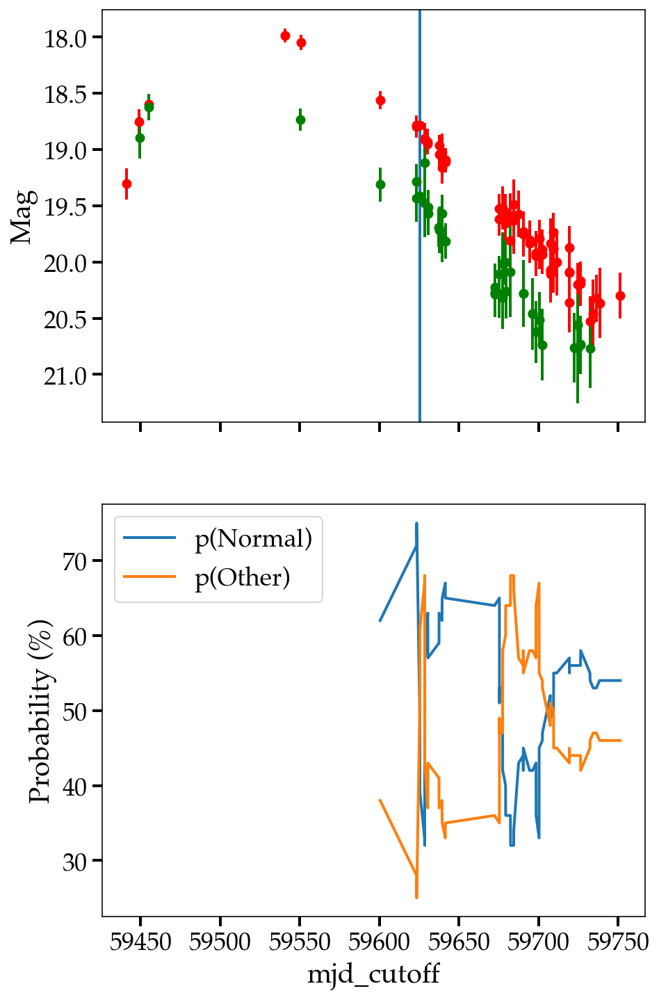

ZTF20acjfimy SN Ia
ZTF21aagsihi SN Ia
ZTF21aaquhqr SN II
ZTF20acpqagp SN Ia
ZTF21aagygzv SN Ia
ZTF20actvpyc SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21acizbmv SN Ia
ZTF18abxhsyn SN Ia
ZTF20accrkpa SN II
ZTF21abpviss SN Ia
ZTF21aahaksd SN Ia
ZTF21aaigqir SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF20acgiglu SN IIb
ZTF20acobamg SN Ia
ZTF20aczgmai SN IIn
ZTF21abmqpja SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acjrytv SN Ia
ZTF18accrorf SN Ia
ZTF21aapjmgf SN II
ZTF21aakvrgb SN Ia
ZTF21aceaiqm SN Ia
ZTF22aaaenuc SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aavsbkt SN Ia
ZTF21aaxtctv SN Ic
ZTF20accdijx SN II
ZTF21aaxxihx SN Ic-BL
ZTF22aaayjne SN Ia
ZTF18acsohut SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF21aamgcrv SN Ia
ZTF21aalgszc SN Ia
2
https://alerce.online/object/ZTF21aalgszc SN Ia


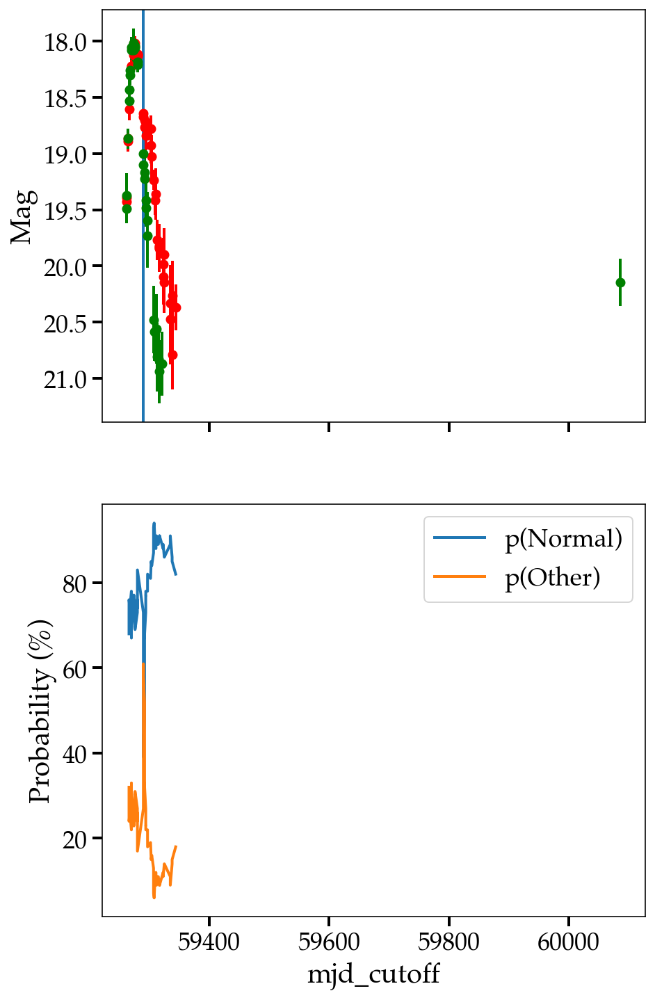

ZTF21abdahai SN II
ZTF21aarasky SN IIb
ZTF20abptxls SN Ia
ZTF21abvdazf SN Ia
ZTF18aaszvfn SN IIP
ZTF20adadrhw SN Ic


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21acdnnfg SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF20acpgzif SN Ia
ZTF21aaukcog SN II
ZTF20acnznms SLSN-II
77
https://alerce.online/object/ZTF20acnznms SLSN-II


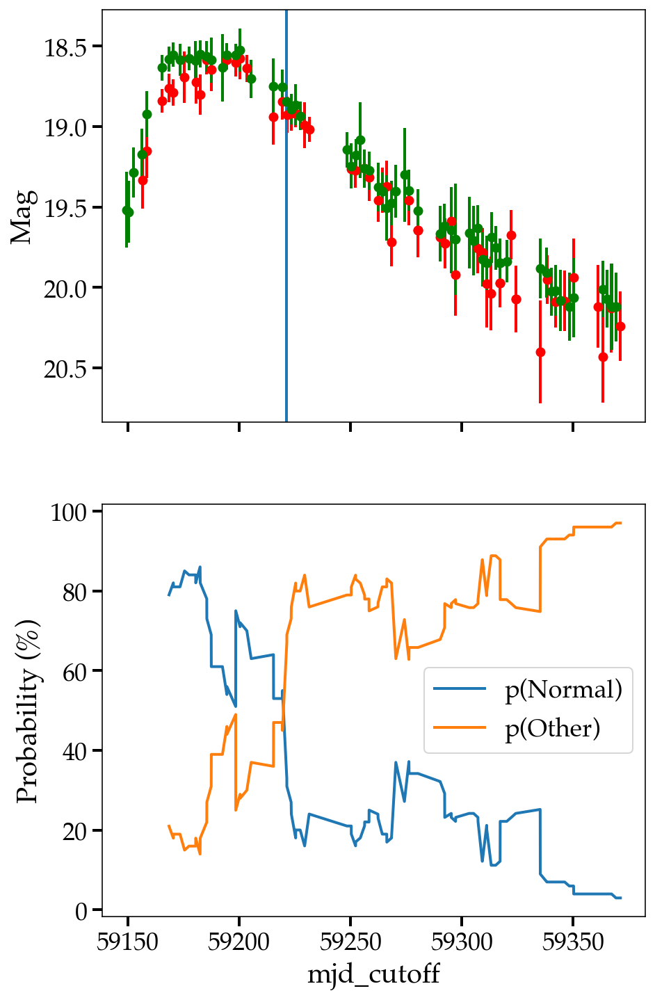

ZTF18aawfofp SN Ia
ZTF21acjxiqw SN IIP
ZTF20acvemao SN Ia
ZTF21abmdhes SN Ia
ZTF21acilvjb SN Ia
ZTF22aaaehtn SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aagtqgq SN Ia
ZTF21aagoliy SN Ia
ZTF21aadatfg SN Ic-BL
ZTF21aasafkl SN Ia
ZTF21aasbjgq SN Ia
ZTF21abxzzys SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF18abuxjrd SN Ia
ZTF20acgchsp SN II
ZTF21aaoqbbw SN IIn
ZTF21aabfwwl SN II
ZTF21aatwlhj SN Ia
ZTF21aaxxoei SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abctnoh SN Ia
ZTF21abtsoky SN Ia
ZTF22aaabpkx SN Ia
ZTF20adagenq SN Ia
ZTF20aceokvr SN IIn
ZTF19abkftvd SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF21aaaadvr SN II
2
https://alerce.online/object/ZTF21aaaadvr SN II


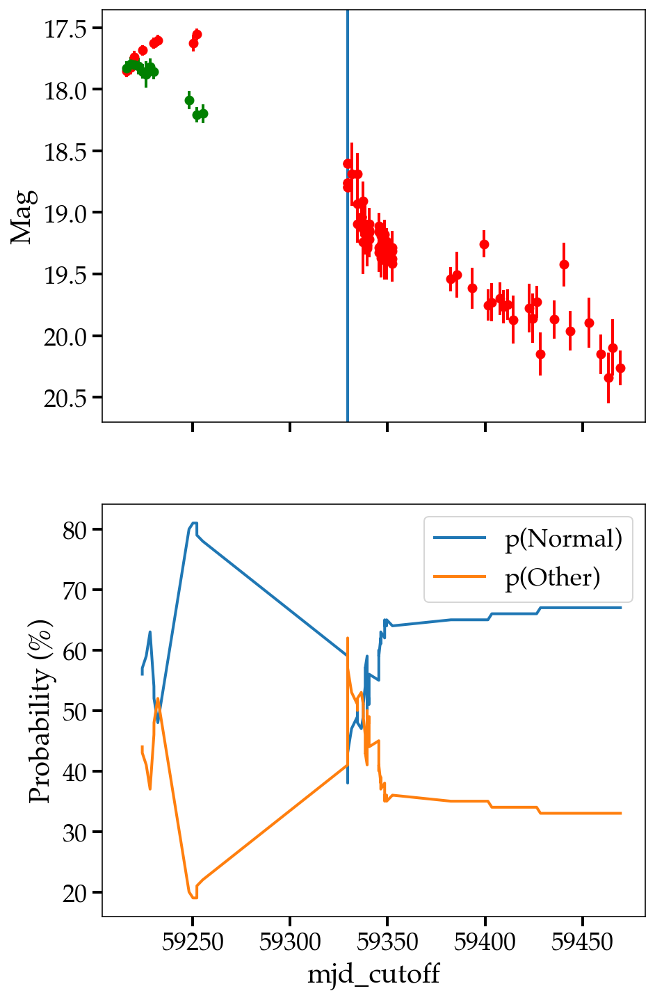

ZTF20abrjmgi SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


6
https://alerce.online/object/ZTF20abrjmgi SN Ia


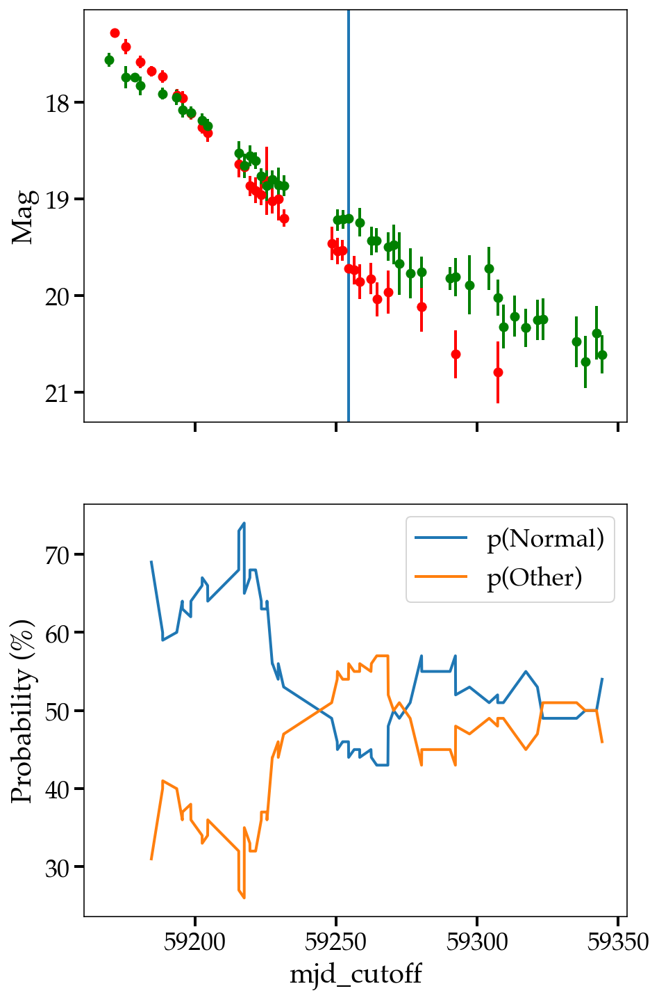

ZTF21aaaovua SN Ia
ZTF21aapfpod SN Ia
ZTF20acxyipy SN Ia
ZTF21acermmd SN Ia
ZTF18abaeqpf SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

80
https://alerce.online/object/ZTF18abaeqpf SN II


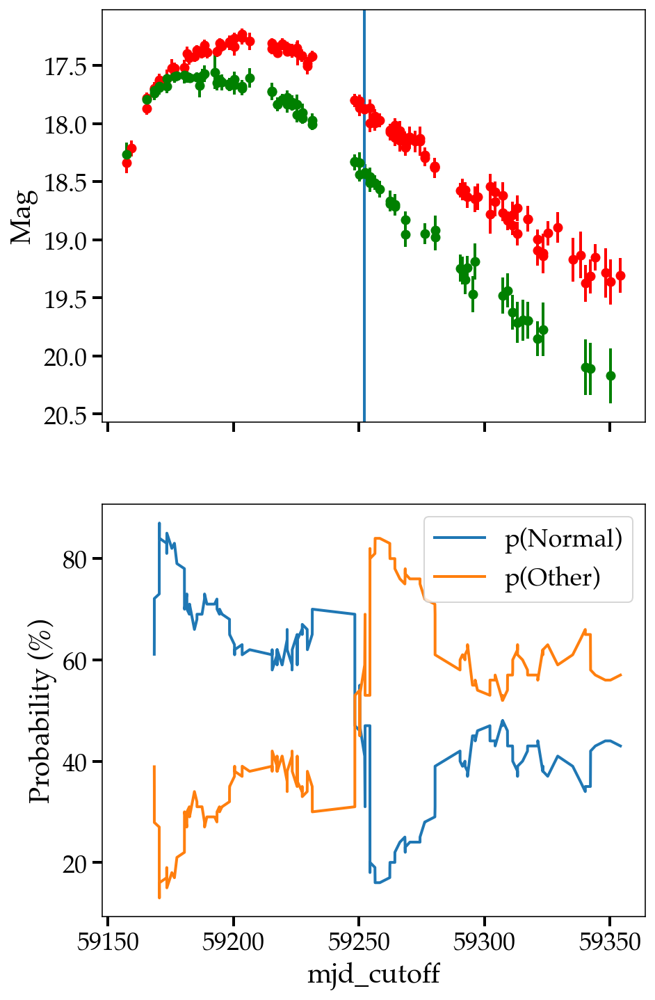

ZTF18actuhrs SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


5
https://alerce.online/object/ZTF18actuhrs SN Ia


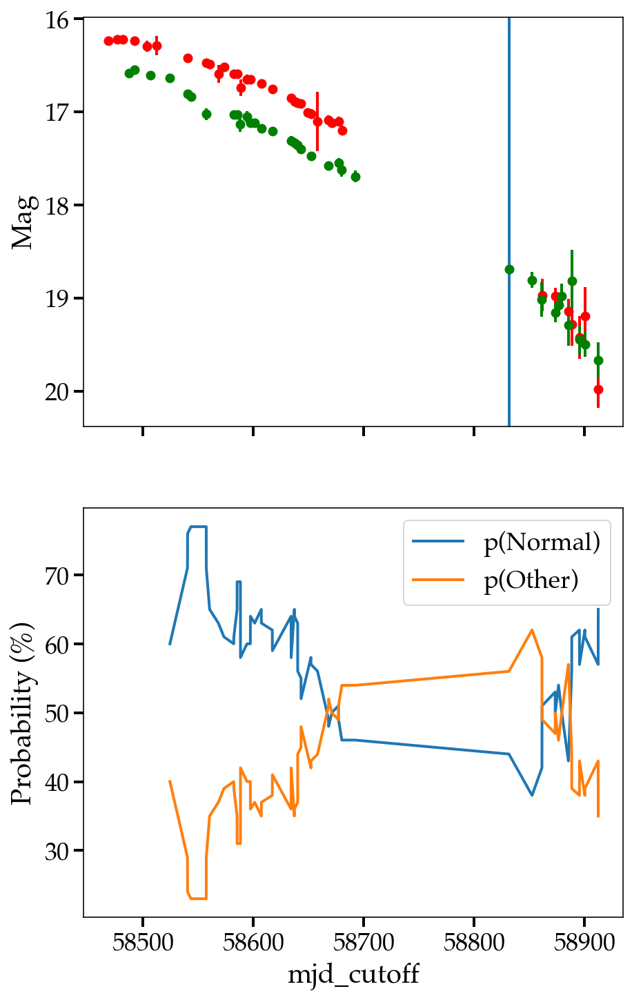

ZTF21abvdyoj SN Ia
ZTF21aavodtn SN Ia
ZTF21aaaalaf SN Ia
ZTF20acwofhd SN Ic


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


ZTF21aafnabs SN Ia
ZTF21aayonfd SN Ic
ZTF21abcfgub SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF21aawzsew SN Ia
ZTF21abowpnd SN Ia
ZTF21aaljjvt SN Ia
ZTF21abjamta SN II
ZTF20acpkprl SN Ia
ZTF20ackpjmb SN Ia


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

ZTF21abtgbwr SN Ia
ZTF21ackcrao SN Ia
ZTF21abtmczy SN Ia
ZTF21abaiicy SN Ia
ZTF22aaacwup SN Ia
ZTF20acpqbfu SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aavozbk SN Ia
ZTF20abzvxyk SN Ia
6
https://alerce.online/object/ZTF20abzvxyk SN Ia


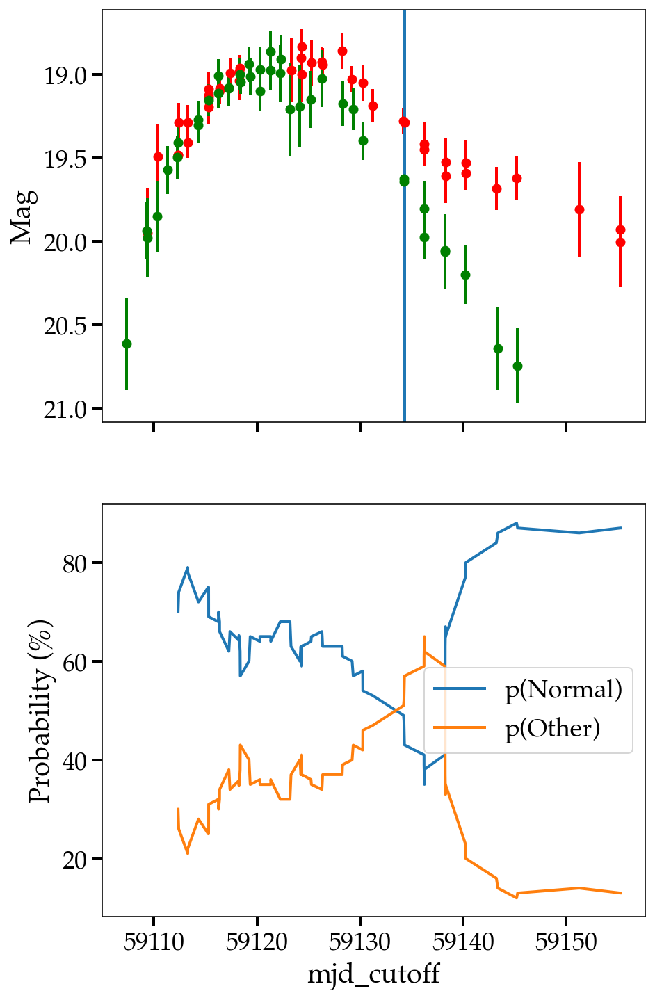

ZTF20acounxo SN IIn
ZTF20acfvgdp SN II
ZTF19aaadwfi SLSN-II
ZTF21abmspzt SN Ia
ZTF21aagojfe SN Ia
ZTF21abbgkgc SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acyybvq SN Ia
ZTF21aaxtzzj SN II
ZTF18acploez SN II
ZTF21aapffqd SN II
6
https://alerce.online/object/ZTF21aapffqd SN II


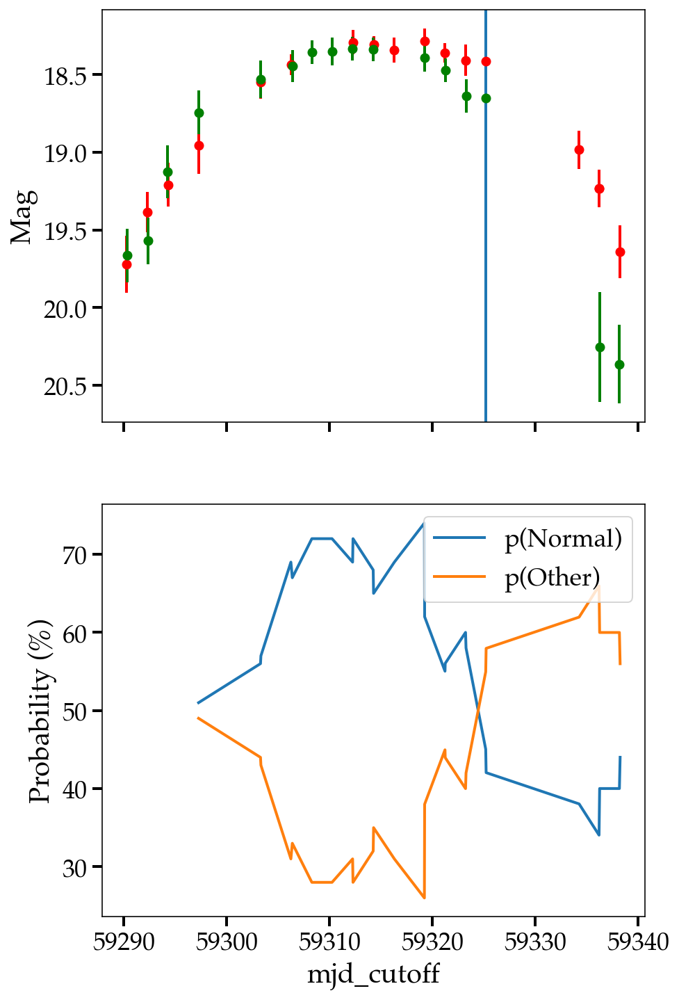

ZTF22aaacdfe SN Ia
ZTF21abkkuja SN Ia
ZTF21acfccil SN Ia-91T-like
ZTF20acmntog SN Ia
ZTF21aaradzm SN IIn
ZTF20acwytxn TDE


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aadrtcs SN Ia
ZTF20aczhajq SN Ia
ZTF22aabhtsw SN Ia
ZTF21aaxvcmj SN Ib
ZTF22aaarcds SN Ia
couldn't feature space as func of time for ZTF22aaarcds. Make anom epoch -9
ZTF21abnspht SN Ia
ZTF20abqlmwn SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

41
https://alerce.online/object/ZTF20abqlmwn SN II


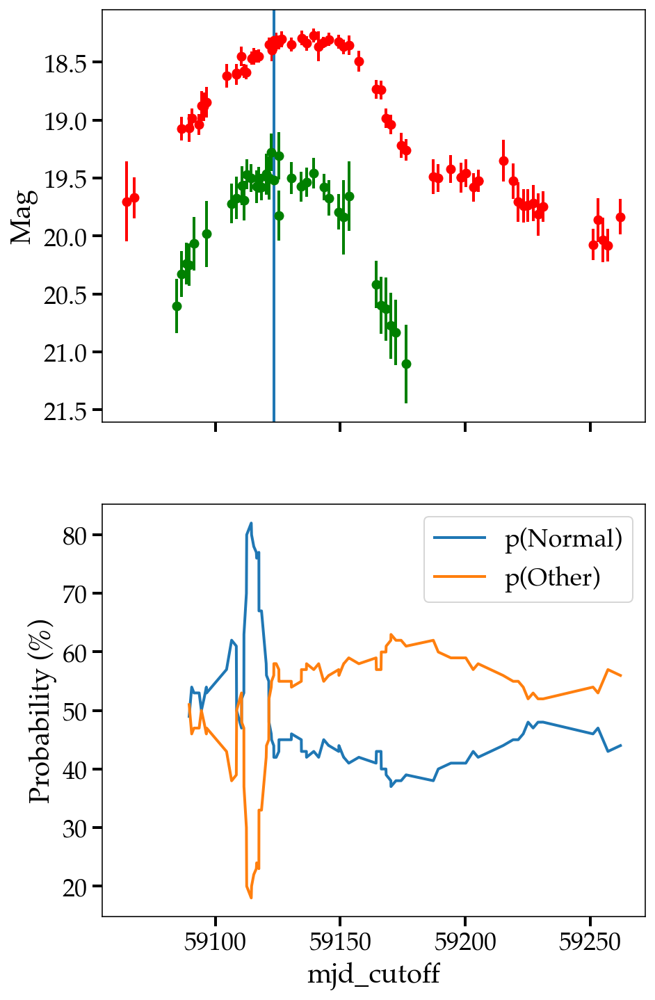

ZTF21abrlslx SN Ia
ZTF20acpkzxq SN Ia
ZTF21acqvuyb SLSN-II
ZTF21aagtqna SN II
ZTF20actskcf SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acwfcfs SN Ia
ZTF21aanuyro SN Ia
ZTF21acioiha SN Ia
ZTF21aaabviz SN Ia
ZTF20acpkpla SN Ia
ZTF21aaaecrv SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20achrklb SN Ia-91T-like
ZTF20acwogqz SN Ia
ZTF21abpyauz SN II
16
https://alerce.online/object/ZTF21abpyauz SN II


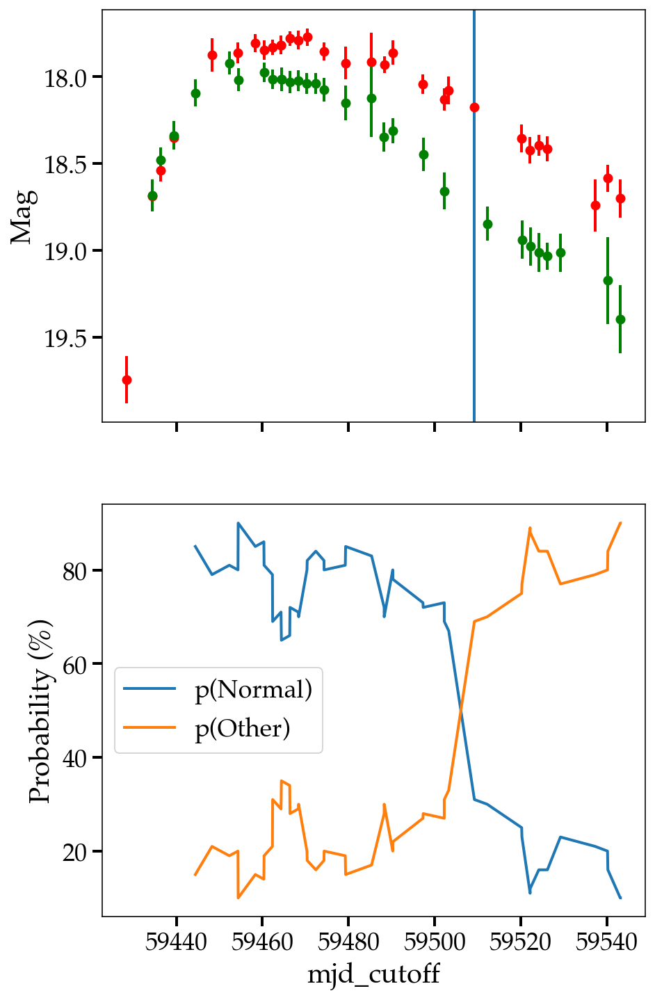

ZTF20acwozwz SN Ia
ZTF21abfjgwr SN Ia
ZTF21aahfjrr SN IIn
ZTF21aaufthj SN Ia
ZTF21aalnyny SN Ia
ZTF20acplqek SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21ackwgzm SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF21acjmvhx SN Ic-BL
ZTF20aciuftf SN Ia
ZTF21abxdibe SN Ia
ZTF21aanzcuj SN II
ZTF20acwyoxc SN Ia
ZTF21aaxgzln SN Ia


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

ZTF21abfiuqf SN II
ZTF20acorjop SN II
ZTF20aclxbwk SN Ia
ZTF20achbejn SN II
ZTF21aaxwcgj SN Ia
ZTF21aaqgrrf SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abeokcr SN Ia
ZTF21aavqphe SN Ia
ZTF21acdalyp SN Ia-91T-like
ZTF21abdcauj SN Ia
ZTF21aaetnfe SN Ia
ZTF21acgzwsc SN Ia
ZTF21aatklhw SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [35]:
import antares_client

df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/CVAE_dataframes"
anom_thresh = 55

num_anom_epochs_l = []
anom_ztfid_l, tnscls_l = [],[]
for anom_ztfid, tnscls in zip(x_test_all.index, x_test_all.tns_cls):
    print(anom_ztfid, tnscls)
    try:
        lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
    except:
        print(f"couldn't feature space as func of time for {anom_ztfid}. Make anom epoch -9")
        num_anom_epochs_l.append(-9)
        continue
        
    lc_and_hosts_df = lc_and_hosts_df.dropna()
    anom_obj_df = lc_and_hosts_df[x_test.columns]
    
    pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)
    num_anom_epochs = len(np.where(pred_prob_anom[:, 1]>=anom_thresh)[0])
    num_anom_epochs_l.append(num_anom_epochs)
    
    try: 
        #anom_idx = np.where(pred_prob_anom[:, 1]>=50)[0][0]
        orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
        diff = len(orig)-len(pred_prob_anom)
        anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff

    except: continue

    ztf_id_ref = anom_ztfid 

    ref_info = antares_client.search.get_by_ztf_object_id(ztf_object_id=ztf_id_ref)

    try: df_ref = ref_info.timeseries.to_pandas()
    except: continue

    print(num_anom_epochs)
    anom_ztfid_l.append(anom_ztfid), tnscls_l.append(tnscls)

    df_ref_g = df_ref[(df_ref.ant_passband == 'g') & (~df_ref.ant_mag.isna())]
    df_ref_r = df_ref[(df_ref.ant_passband == 'R') & (~df_ref.ant_mag.isna())]

    mjd_idx_at_min_mag_r_ref = df_ref_r[['ant_mag']].reset_index().idxmin().ant_mag
    mjd_idx_at_min_mag_g_ref = df_ref_g[['ant_mag']].reset_index().idxmin().ant_mag

    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7,12))
    ax1.invert_yaxis()
    ax1.errorbar(x=df_ref_r.ant_mjd, y=df_ref_r.ant_mag, yerr=df_ref_r.ant_magerr, fmt='o', c='r', 
                label=f'REF: {ztf_id_ref}')
    ax1.errorbar(x=df_ref_g.ant_mjd, y=df_ref_g.ant_mag, yerr=df_ref_g.ant_magerr, fmt='o', c='g')
    #ax1.axvline(x=lc_and_hosts_df.loc[lc_and_hosts_df.loc[anom_idx].obs_num].mjd_cutoff)
    ax1.axvline(x=lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx].mjd_cutoff.values[0])
    #ax1.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))
    ax1.set_ylabel('Mag')


    print(f'https://alerce.online/object/{anom_ztfid}', tnscls)
    ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 0], label='p(Normal)')
    ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 1], label='p(Other)')
    #ax2.axhline(y=50)

    ax2.set_ylabel('Probability (%)')


    #ax2.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

    plt.xlabel('mjd_cutoff')
    plt.legend()
    plt.show()

In [36]:
for ob, cl in zip(anom_ztfid_l, tnscls_l):
    print(f'https://alerce.online/object/{ob}', cl)

https://alerce.online/object/ZTF20abarsvz SN Ia
https://alerce.online/object/ZTF21abrxoir SN Ia
https://alerce.online/object/ZTF21abzbwfo SN II
https://alerce.online/object/ZTF20abwxywy SN Ic
https://alerce.online/object/ZTF21aaizyqc SN II
https://alerce.online/object/ZTF21aajvukh SN II
https://alerce.online/object/ZTF20actekrw SN Ic
https://alerce.online/object/ZTF21abcnpnk SN Ia
https://alerce.online/object/ZTF20accmtgt SN Ia
https://alerce.online/object/ZTF21aautijg SN IIn
https://alerce.online/object/ZTF21aaxstzy SN Ia
https://alerce.online/object/ZTF21aalxurx SN II
https://alerce.online/object/ZTF21aadacxv SN II
https://alerce.online/object/ZTF20acxqxyw SN Ib
https://alerce.online/object/ZTF21abcgnqn TDE
https://alerce.online/object/ZTF20acuhgar SN II
https://alerce.online/object/ZTF18acvgjqv SN IIn
https://alerce.online/object/ZTF18acaqdaa TDE
https://alerce.online/object/ZTF21aaphlty SN Ia
https://alerce.online/object/ZTF20acyroke SN Ia
https://alerce.online/object/ZTF20accodxy 

In [37]:
Counter(x_test_all.tns_cls)

Counter({'SN Ia': 279,
         'SN Ib': 4,
         'SN IIP': 4,
         'SN II': 63,
         'SN Ic': 8,
         'SN Ia-91T-like': 9,
         'SN Ic-BL': 4,
         'SN IIn': 13,
         'TDE': 8,
         'SN IIb': 5,
         'SLSN-II': 3})

In [38]:
Counter(tnscls_l)

Counter({'SN Ia': 12,
         'SN II': 12,
         'SN Ic': 2,
         'SN IIn': 3,
         'SN Ib': 1,
         'TDE': 4,
         'SN Ia-91T-like': 1,
         'SLSN-II': 1})

In [39]:
print(f"Anom threshold = {anom_thresh}%\n-----------")
for scls in np.unique(x_test_all.tns_cls):
    print(f"{scls}: {Counter(tnscls_l).get(scls)} / {Counter(x_test_all.tns_cls).get(scls)}")

Anom threshold = 55%
-----------
SLSN-II: 1 / 3
SN II: 12 / 63
SN IIP: None / 4
SN IIb: None / 5
SN IIn: 3 / 13
SN Ia: 12 / 279
SN Ia-91T-like: 1 / 9
SN Ib: 1 / 4
SN Ic: 2 / 8
SN Ic-BL: None / 4
TDE: 4 / 8


In [40]:
#14/(15+19) # 0.4117% purity as func of time at anom_thresh of 49.5%
12/(12+12) # 50% purity as func of time at anom_thresh of 55%

0.5

### misclassified as Other are still largely very interesting! Closeby Ia, red, IIn-like, IIb-like, long lived...

# XXX haven't updated below

In [36]:
%%time 
# In summary, you train your Random Forest Classifier to classify your data, 
# and then use the Isolation Forest algorithm on the output probabilities of the Random Forest Classifier 
# to detect anomalies.

from sklearn.ensemble import IsolationForest

anomaly_scores = IsolationForest(n_estimators=500, 
                                random_state=10, 
                                contamination=0.25,
                                max_features=11, # 12 for with None cls
                                n_jobs=-1).fit(predicted_probability).decision_function(predicted_probability)

CPU times: user 982 ms, sys: 372 ms, total: 1.35 s
Wall time: 1.02 s


In [37]:
most_anomalous_indices = np.argsort(anomaly_scores)[:25]
most_anomalous_samples = df2.iloc[most_anomalous_indices]
most_anomalous_samples

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,SN IIP,SN IIb,SN IIn,SN Ia,SN Ia-91T-like,SN Ib,SN Ic,SN Ic-BL,TDE,RFC_best_cls
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF20aceokvr,0.772009,3.986711,0.225000,0.025000,0.417498,1.497513,1.275409,0.608335,-0.234187,0.012752,...,21.0,10.0,11.0,15.0,4.0,3.0,2.0,19.0,0.0,SN IIP
ZTF21abpyauz,0.987303,1.645826,0.137931,0.034483,0.388388,1.893584,0.901166,0.565298,4.289138,0.002772,...,0.0,0.0,47.0,11.0,0.0,0.0,0.0,0.0,1.0,SN IIn
ZTF21acmnpqa,0.670024,0.165766,0.400000,0.000000,0.383080,1.340048,1.340048,0.741808,-0.567954,-0.002162,...,8.0,13.0,8.0,21.0,1.0,38.0,6.0,1.0,0.0,SN Ib
ZTF21aautijg,0.678457,2.020706,0.171429,0.057143,0.343146,1.276674,0.609076,0.267091,5.422472,-0.000680,...,0.0,0.0,20.0,17.0,1.0,0.0,0.0,4.0,3.0,SLSN-II
ZTF21abgkfzh,0.441565,0.789434,0.294118,0.088235,0.396573,0.869656,0.599177,0.282619,0.081786,0.004576,...,12.0,0.0,49.0,4.0,1.0,0.0,0.0,6.0,0.0,SN IIn
ZTF21aapvvtb,0.284339,0.247243,0.357143,0.000000,0.368838,0.568678,0.534634,0.315300,-0.907417,0.006679,...,0.0,0.0,0.0,9.0,4.0,0.0,0.0,0.0,82.0,TDE
ZTF21aakigqr,0.339321,0.262226,0.200000,0.050000,0.350327,0.678642,0.362262,0.211516,0.764990,0.000725,...,27.0,0.0,7.0,8.0,2.0,4.0,0.0,6.0,1.0,SN II
ZTF21aafmkjk,0.671348,0.793086,0.234043,0.042553,0.405861,1.129119,0.569957,0.387455,0.269652,0.002722,...,4.0,0.0,35.0,13.0,1.0,1.0,0.0,2.0,9.0,SN IIn
ZTF20aatxryt,1.710750,0.856208,0.305556,0.055556,0.387801,3.417209,2.333250,1.125550,0.505491,0.009653,...,0.0,0.0,21.0,20.0,2.0,0.0,8.0,5.0,15.0,SN IIn


In [38]:
for obj, cls, rfc_cls in zip(most_anomalous_samples.index, most_anomalous_samples.tns_cls, most_anomalous_samples.RFC_best_cls):
    print(f"https://alerce.online/object/{obj}", cls, rfc_cls)

https://alerce.online/object/ZTF20aceokvr SN IIn SN IIP
https://alerce.online/object/ZTF21abpyauz SN II SN IIn
https://alerce.online/object/ZTF21acmnpqa SN Ia SN Ib
https://alerce.online/object/ZTF21aautijg SN IIn SLSN-II
https://alerce.online/object/ZTF21abgkfzh SN IIn SN IIn
https://alerce.online/object/ZTF21aapvvtb TDE TDE
https://alerce.online/object/ZTF21aakigqr SN II SN II
https://alerce.online/object/ZTF21aafmkjk SN IIn SN IIn
https://alerce.online/object/ZTF20aatxryt SN Ia SN IIn
https://alerce.online/object/ZTF20accrkpa SN II SN Ia
https://alerce.online/object/ZTF21aaaalaf SN Ia SN IIP
https://alerce.online/object/ZTF18acvgjqv SN IIn SLSN-II
https://alerce.online/object/ZTF21abplgag SN Ia SN Ic
https://alerce.online/object/ZTF20achmmex SN II SN II
https://alerce.online/object/ZTF21aadatfg SN Ic-BL SN Ia
https://alerce.online/object/ZTF21aahfjrr SN IIn SN IIn
https://alerce.online/object/ZTF21aaabwfu SN IIb SN Ib
https://alerce.online/object/ZTF20acwytxn TDE SN IIn
https://aler

In [39]:
# All long lived or big color difference

In [40]:
Counter(most_anomalous_samples['tns_cls'])

Counter({'SN IIn': 6,
         'SN II': 6,
         'SN Ia': 5,
         'TDE': 3,
         'SN Ic-BL': 3,
         'SN IIb': 1,
         'SLSN-II': 1})

In [41]:
Counter(most_anomalous_samples['RFC_best_cls'])

Counter({'SN IIP': 2,
         'SN IIn': 8,
         'SN Ib': 2,
         'SLSN-II': 2,
         'TDE': 1,
         'SN II': 6,
         'SN Ia': 3,
         'SN Ic': 1})

### Feature importance

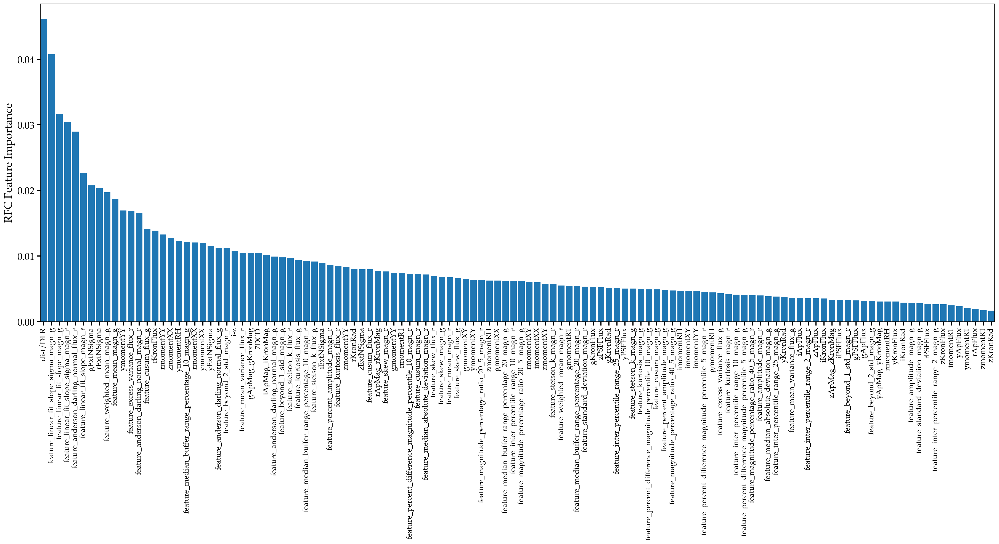

In [42]:
importances = clf.feature_importances_
indices = np.argsort(importances)[::-1]

X_train = dataset_bank_tns_df_resampled_train.iloc[:, 0:120]

fig, ax = plt.subplots(figsize=(24, 8))
ax.bar(range(X_train.shape[1]), importances[indices])
ax.set_xticks(range(X_train.shape[1]))
ax.set_xticklabels(X_train.columns[indices], rotation=90, fontsize=14)
plt.subplots_adjust(left=0.0, right=1, top=1.0, bottom=0)
ax.set_xlim(left=-0.40, right=119.4)
plt.ylabel('RFC Feature Importance')
plt.savefig(f'{folder_path}/RFC_feature_importance_horizontal.jpg', dpi=300, bbox_inches='tight')
plt.show()

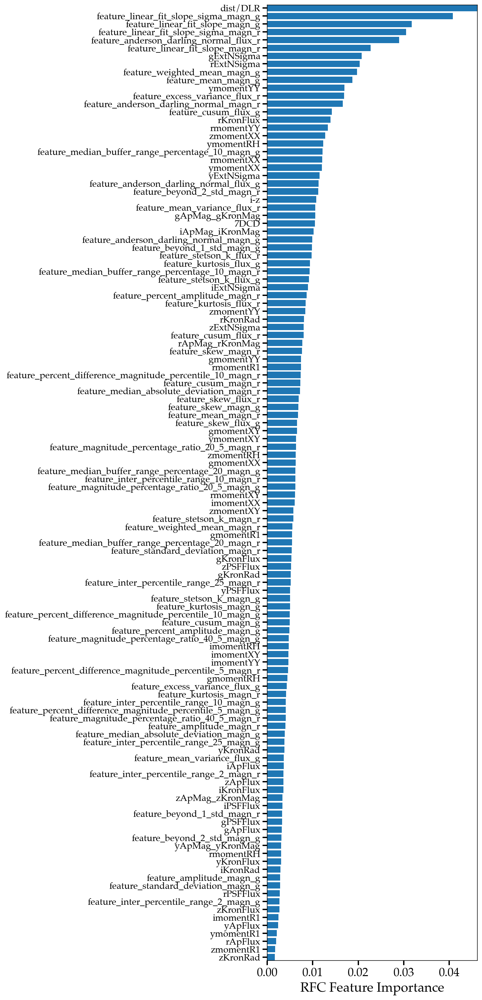

In [43]:
fig, ax = plt.subplots(figsize=(8, 20))
ax.barh(range(X_train.shape[1]), importances[indices][::-1])
ax.set_yticks(range(X_train.shape[1]))
ax.set_yticklabels(X_train.columns[indices][::-1], fontsize=14)
plt.subplots_adjust(left=0.4, right=0.95, top=1.0, bottom=0)
ax.set_ylim(top=119.4, bottom=-0.40)
ax.set_xlim(right=np.max(importances[indices][::-1]))
plt.xlabel('RFC Feature Importance')
plt.savefig(f'{folder_path}/RFC_feature_importance_vertical.jpg', dpi=300, bbox_inches='tight')
plt.show()

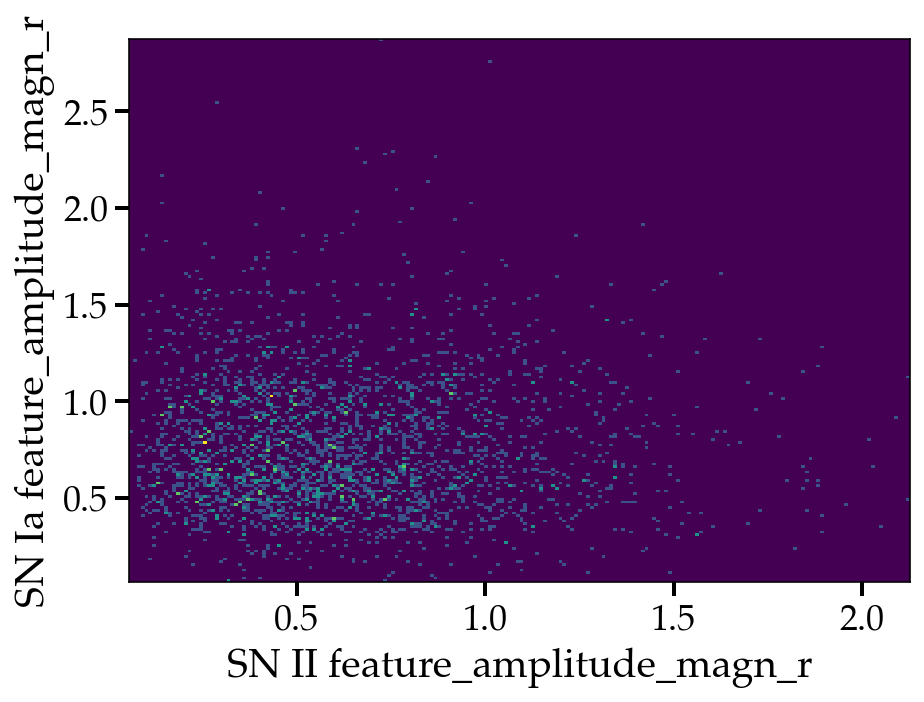

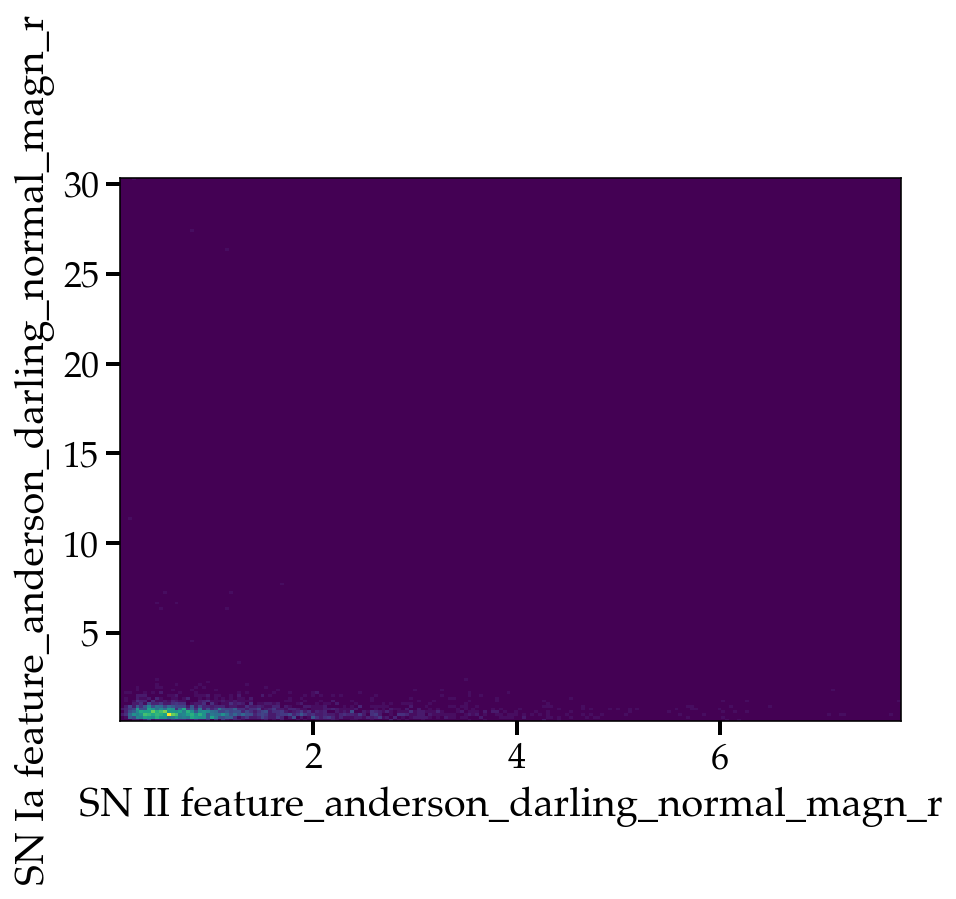

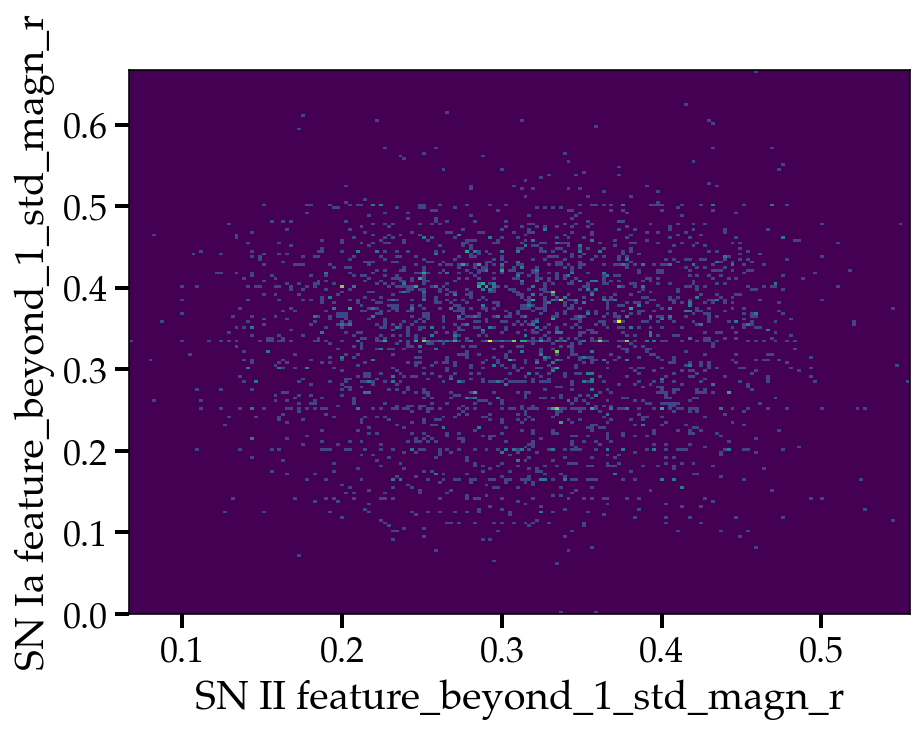

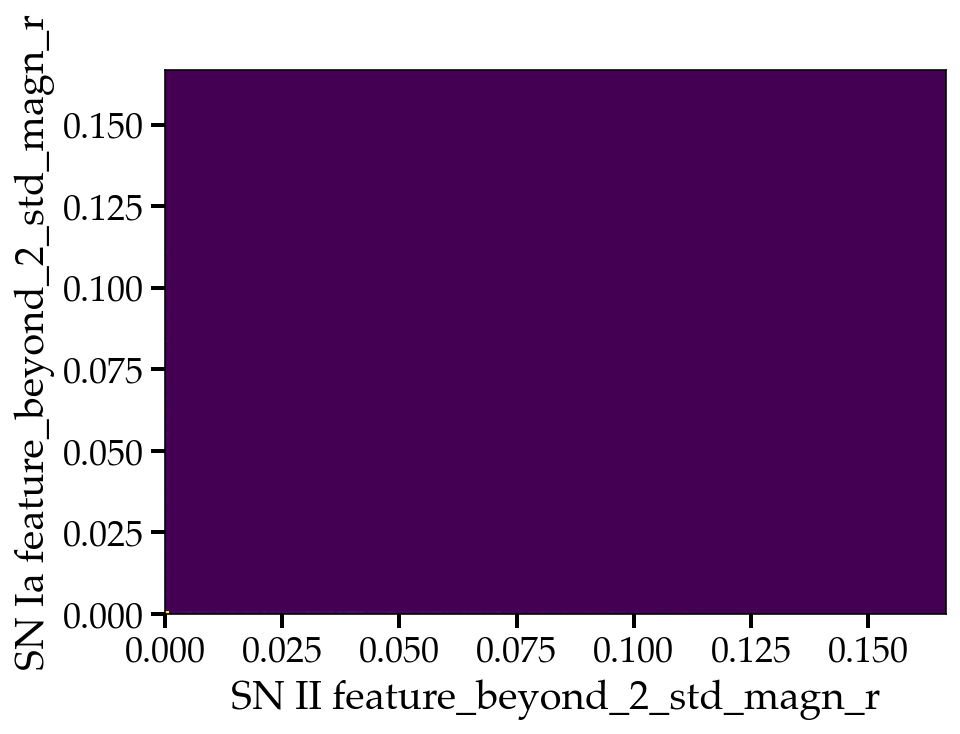

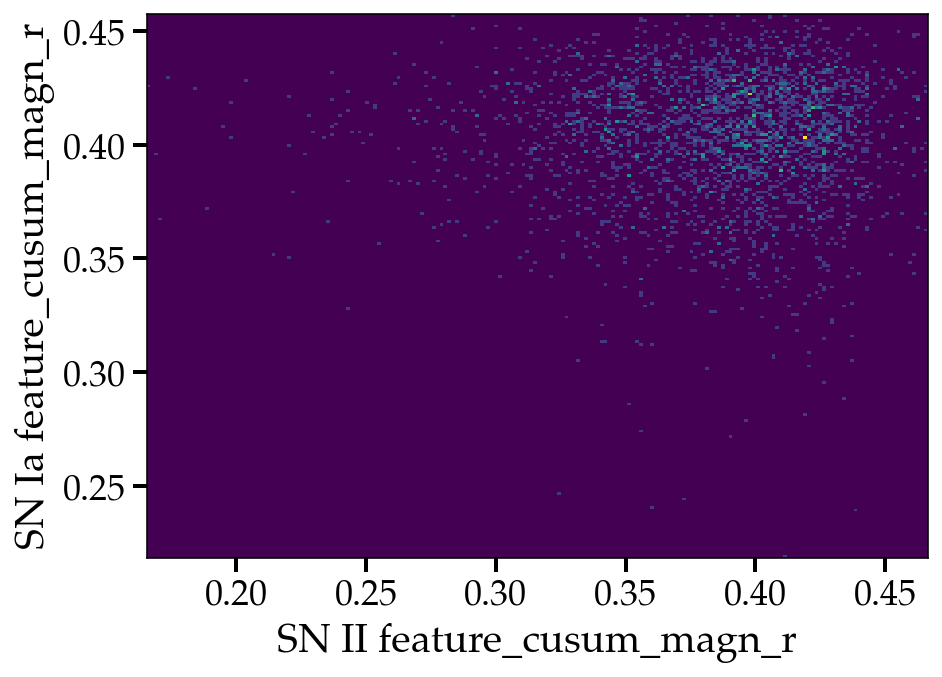

...

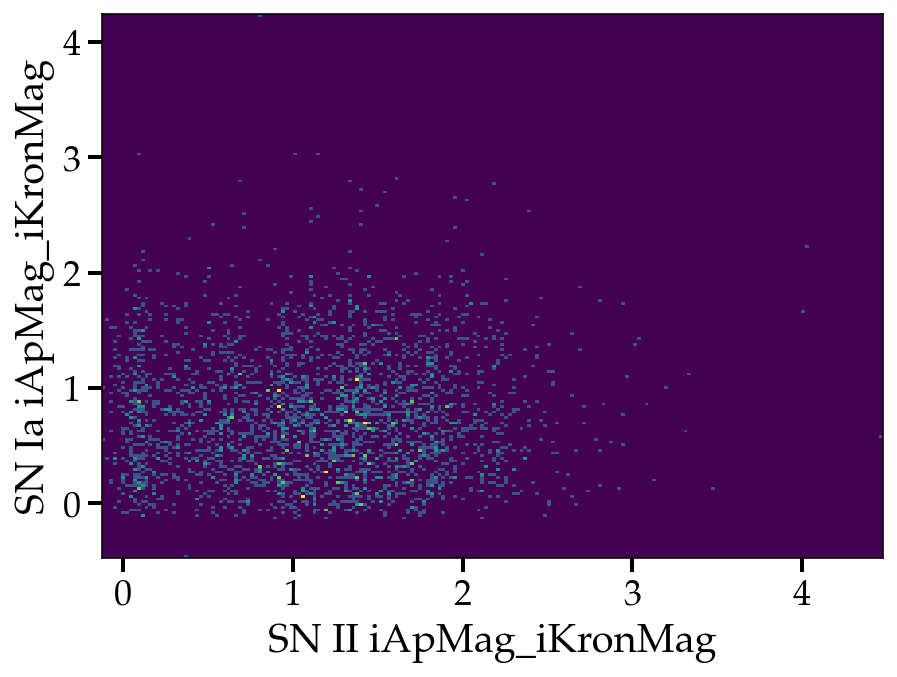

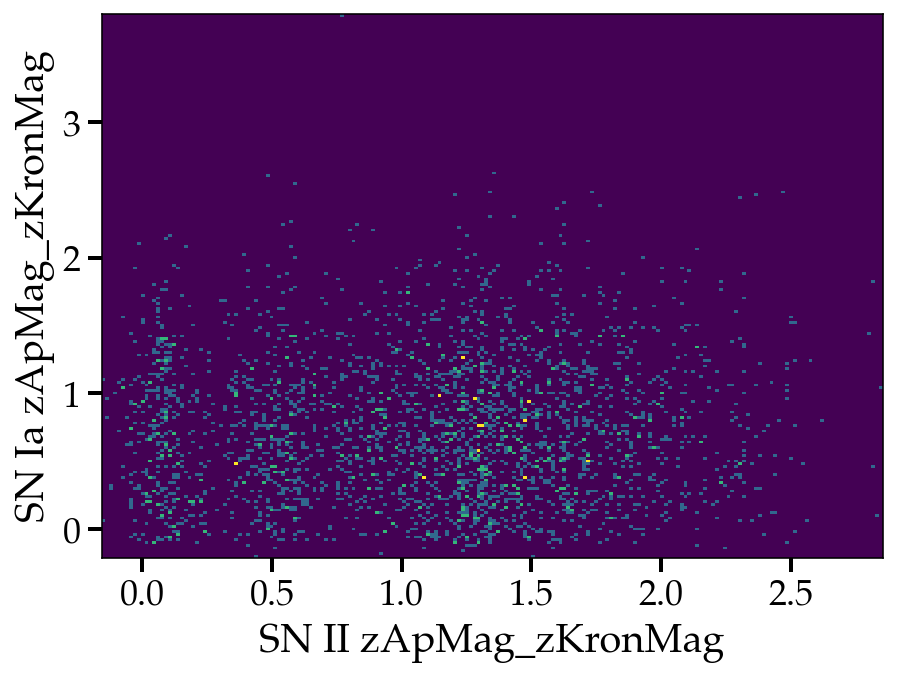

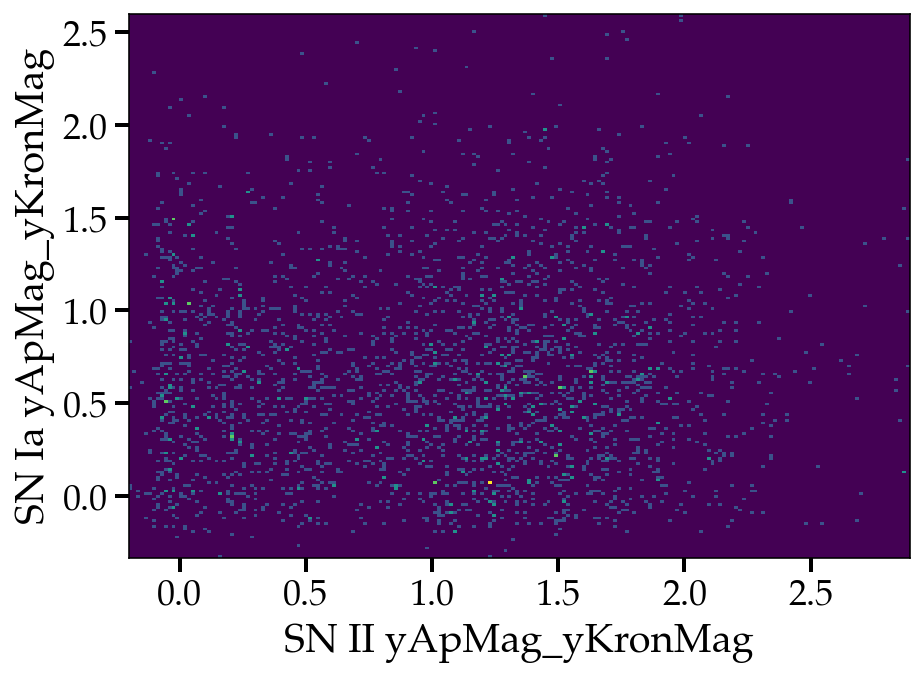

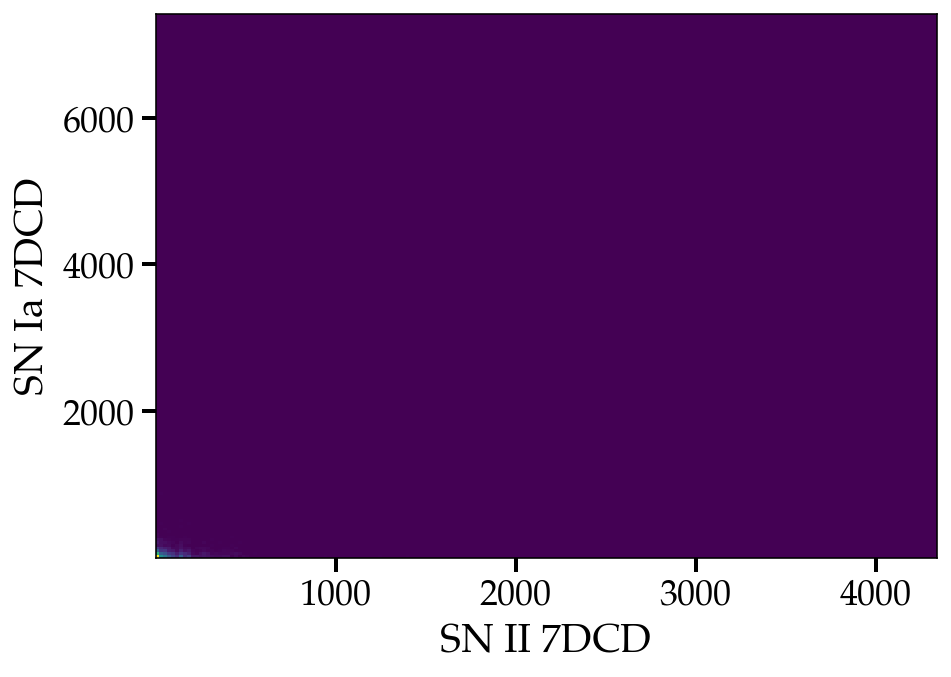

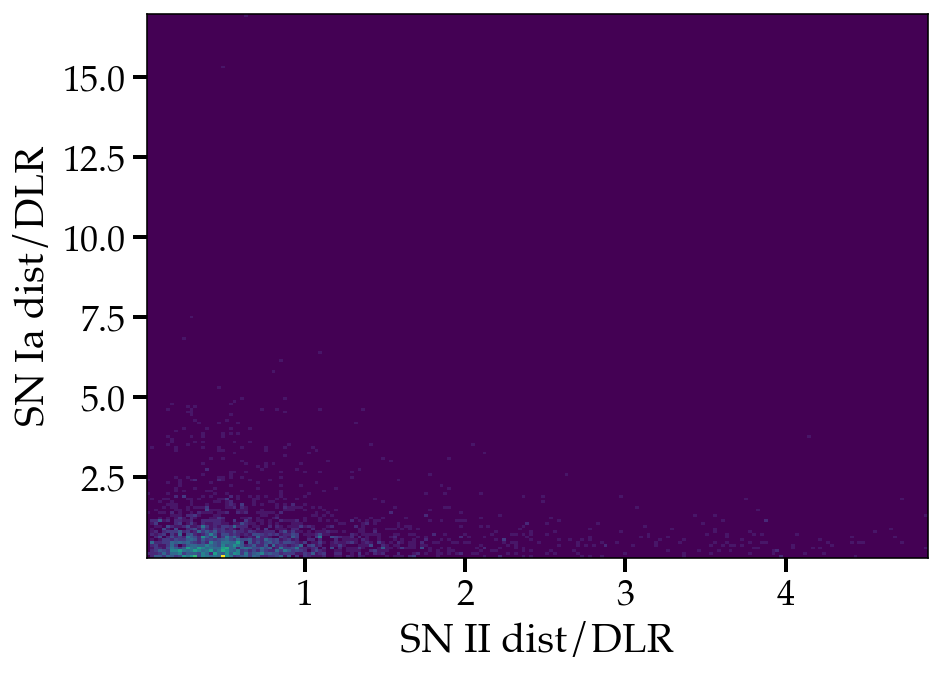

In [37]:
snii_df = dataset_bank_tns_df_resampled_train[dataset_bank_tns_df_resampled_train.tns_cls == "SN II"]
snia_df = dataset_bank_tns_df_resampled_train[dataset_bank_tns_df_resampled_train.tns_cls == "SN Ia"]

for i in range(0, 120, 1):
    feat = lc_and_host_features[0:120][i]
    plt.hist2d(snii_df[feat], snia_df[feat], bins=200)
    plt.xlabel(f"SN II {feat}")
    plt.ylabel(f"SN Ia {feat}")
    plt.show()